In [1]:

!pip install LAMP-core
#get_ipython().system(' pip3 install LAMP-core')



In [279]:
pip install LAMP-core

Note: you may need to restart the kernel to use updated packages.


In [1]:
# ## Install LAMP package

# To query data in LAMP, we will use LAMP-py, a Python package which utilizes the LAMP API.
# 
# See LAMP-py documentation at https://github.com/BIDMCDigitalPsychiatry/LAMP-py for further API details.


In [1]:

import LAMP
import numpy as np
import pdb
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import datetime
from scipy import io
from tqdm import tqdm
from scipy import stats
import itertools
import pickle 
import math

font = {'size'   : 15}

matplotlib.rc('font', **font)

#
# There are two Researcher profiles that contain data on schizophrenia patients: NIH1 and NIH2
#
# Patients in NIH1 participated for 90 days 
# Patients in NIH2 participated (or are participating) for 1 year 
#

# In order to access data via the LAMP API, you must enter your credentials. 

# In order to query data from a given profile, you must enter in credentials specific to that profile
# 
# For NIH1:

LAMP.connect("tanvi_ranjan_nih1@lamp.com", "LAMPLAMP")

#
# To access data from the other profile (in this case, NIH2), you must reconnect with credentials for the second prof
#

LAMP.connect("tanvi_ranjan_nih2@lamp.com", "LAMPLAMP")


In [2]:

# Constants for each Researcher profile

# NIH1 
NIH1_RESEARCHER = "pd989rk5hzh2r4a84kha" #research profile

# Study profiles
# SZ patients are in two different profiles; COH1 contains patients who received 1 survey/day, and COH2 is 2 surveys/day 
NIH1_COH1 = "59mhxae3nbqc6vhq1m0d"
NIH1_COH2 = "48am6atdypxbqsnnd9sa"

NIH1_CONTROLS = "asyykh81k73452a9jdsm"

#NIH2
NIH2_RESEARCHER = "rzhd6cwztfqw0tagx0s5"

# Studies and participants in the NIH2 profile are organized differently than those in the NIH1 profile.
# In NIH2, each Study is a unique patient with one Participant (one study, "jz1g10pahpx6536x0waw", has data dispersed across two profiles)
#  

NIH2_STUDIES = LAMP.Study.all_by_researcher(NIH2_RESEARCHER)['data']
NIH2_STUDIES


[{'id': '1dvcvjem1z381rsshqrg', 'name': 'A B'},
 {'id': 'se8q72p1gasn2b3cvhtv', 'name': 'A H'},
 {'id': 'bvhtyxshxg4rm8vt7s94', 'name': 'L A'},
 {'id': '95mfa53g6ws924eev916', 'name': 'C J'},
 {'id': 'jz1g10pahpx6537x0waw', 'name': 'T H'},
 {'id': 'y772skbpyr35h597zmhy', 'name': 'Q S'},
 {'id': '0m8tme51bpxd2gchtax6', 'name': 'M L'},
 {'id': 'eercjgcf4ka5vgqs3awa', 'name': 'M V'},
 {'id': 'x30p4k407b5h1q3de8wc', 'name': 'K I'},
 {'id': '0ekq9kad5reqz1mfxgt2', 'name': 'A A'},
 {'id': 'cge9mcf1e1qw9y66djan', 'name': 'A S'},
 {'id': 'sy3b47x9evme1mj86pr7', 'name': 'K G'},
 {'id': 'ga1ezg9wxnxb371hvnp7', 'name': 'C R'},
 {'id': 'x027wp2ptt8vezxdk8z2', 'name': 'D R'},
 {'id': 't2ysqrwhzt6pb5hn2adm', 'name': 'S? '},
 {'id': 'kcdata9qbenrn7g6m0f1', 'name': 'AT '},
 {'id': '4qcy1r5yv2rzmxg5amgd', 'name': 'JJ H'},
 {'id': 'kwr39x3jx5hpy5ths7jc', 'name': 'J M'},
 {'id': '7ta32ear2s8934f42r5k', 'name': 'NJ '},
 {'id': 'wzx8210zhxb7y80xj6y3', 'name': 'W B'},
 {'id': '1xvxy5g8xt650rmb61hq', 'name':

In [3]:

# Sensor Data

# LAMP collects data from smartphone sensors. In LAMP, these sensors are specified as "Sensor" objects, and data from them are collected as "SensorEvents."
# For a comprehensive overview of smartphones sensors, please see https://docs.lamp.digital/Data-Types-99b045852c7b406f87c124b927fe95fa

# Previously we used the Beiwe framework () to collect sensor data. Thus, for some participants (including NIH1 and NIH2 patients), sensor data is stored as types "beiwe.accelerometer", "beiwe.gps", etc.
# A full list of Beiwe sensors that may be present for a given Participant:

beiwe_sensors = ["beiwe.accelerometer", "beiwe.gyro", "beiwe.magnetometer",
                 "beiwe.devicemotion", "beiwe.reachability", "beiwe.bluetooth",
                 "beiwe.calls", "beiwe.proximity", "beiwe.gps", 
                 "beiwe.power_state", "beiwe.texts", "beiwe.wifi"
                 "beiwe.app_log","beiwe.ios_log"]



In [4]:

# Query accelerometer data

# Accelerometer data points are SensorEvents with the origin "lamp.accelerometer" or "beiwe.accelerometer"


TEST_PARTICIPANT = LAMP.Participant.all_by_study(NIH2_STUDIES[6]['id'])['data'][0]['id']
#TEST_PARTICIPANT = LAMP.Participant.all_by_study('0m8tme51bpxd2gchtax6')['data'][0]['id']
print(TEST_PARTICIPANT)
participant_accel = LAMP.SensorEvent.all_by_participant(TEST_PARTICIPANT, 
                                                        origin="lamp.accelerometer")['data']

#Just show first five entries
participant_accel[:5];

# Query responses return a max of 1000 entries. If there are more than 1000 events for a given 
# sensor or activity, it will return the 1000 most recent events.
# 
#  To access more data —- or to query during a specific time range -— you must use the "_to" and "from" parameters.
#  (For example, set the "_to" parameter to the timestamp from the oldest event in the 1000 returned #

print(len(NIH2_STUDIES))

U35797573
82


In [5]:
# Excluding some IDs
# 1. Some participants withdrew from the study, so remove those
# 2. Some participants also have duplicate IDs

remove_ids = ['U1862723173', 'U4054795418', 'U518593080', 'U2590337187', 'U4012263787', 'U95554646', 'U54386853', 'U31470911','U4243820406', 'U90734530', 'U21988787', 'U77318711', 'U29630992', 'U3081777197', 'U2606672160', 'U7017359361', 'U2009788965', 'U7668038743', 'U5202709475', 'U4760330548'];
remove_idx = [];

duplicate_ids = ['U2433536796'];
for isubj in range(len(NIH2_STUDIES)):
    try:
        TEST_PARTICIPANT = LAMP.Participant.all_by_study(NIH2_STUDIES[isubj]['id'])['data'][0]['id'];
        if TEST_PARTICIPANT in remove_ids:
            remove_idx.append(isubj);

        if TEST_PARTICIPANT in duplicate_ids:
            pdb.set_trace();
    except:
        # print(f'Participant {isubj}: no data');
        remove_idx.append(isubj);

good_idx = np.delete(np.arange(0,len(NIH2_STUDIES)),remove_idx)
print(f'{len(remove_idx)} participants either have no active data or were excluded from the study very early on, so only {len(good_idx)} remain')
print(f'Participant indices to remove: {remove_idx}');
print(f'Good participants: {good_idx}')
    

25 participants either have no data or were excluded from the study very early on, so only 57 remain
Participant indices to remove: [0, 1, 2, 3, 4, 7, 8, 9, 11, 12, 14, 17, 18, 19, 23, 24, 32, 37, 38, 43, 46, 47, 53, 54, 60]
Good participants: [ 5  6 10 13 15 16 20 21 22 25 26 27 28 29 30 31 33 34 35 36 39 40 41 42
 44 45 48 49 50 51 52 55 56 57 58 59 61 62 63 64 65 66 67 68 69 70 71 72
 73 74 75 76 77 78 79 80 81]


In [352]:
##### Survey data analysis
'''
1. Extract survey data
2. Determine all possible responses to each question and code individual responses
3. Code responses to PANSS scores
3b. Convert data to MATLAB
4. Run an ANOVA
5. Do G-theory and D-theory analysis
'''


'\n1. Extract survey data\n2. Determine all possible responses to each question and code individual responses\n3. Code responses to PANSS scores\n3b. Convert data to MATLAB\n4. Run an ANOVA\n5. Do G-theory and D-theory analysis\n'

In [6]:
# Make a repository of questions
# Subj no 6 has most questions

isubj = 6;
survey = LAMP.Activity.all_by_study(NIH2_STUDIES[isubj]['id'])['data']
ques_all = pd.DataFrame();
for act in survey:
    if act['spec'] == 'lamp.survey':
        aa = pd.DataFrame(act['settings'])
        aa.insert(0,'Name', act['name'])
        ques_all = ques_all.append(aa, ignore_index=True);
print(ques_all)


              Name                                            options  \
0             Mood                                               None   
1             Mood                                               None   
2             Mood                                               None   
3             Mood                                               None   
4             Mood                                               None   
5             Mood                                               None   
6             Mood                                               None   
7             Mood                                               None   
8             Mood                                               None   
9            Sleep                                               None   
10           Sleep                                               None   
11           Sleep                                               None   
12         Anxiety                                 

In [7]:
# Convert all text in options to capitalize() format so case is not a problem when finding index of answers
for i,j in enumerate(ques_all['options']):
    if not(j is None):
        tmp_opt = [opt.capitalize() for opt in ques_all['options'][i]]
        #print(tmp_opt)
        ques_all['options'][i] = tmp_opt;

In [8]:
# Positive and Negative Syndrome Scale (PANSS)

# ------------ POSITIVE SCALE ------------
# Delusions, Conceptual disorganization, Hallucinations, Excitement, Grandiosity, Suspiciousness/persecution, Hostility

# ------------ NEGATIVE SCALE ------------
# Blunted affect, Emotional withdrawal, Poor rapport, Passive/apathetic social withdrawal, Difficulty in abstract thinking, Lack of spontaneity and flow of conversation, Stereotyped thinking

# ------------ GENERAL SCALE -------------
# Somatic concern, Anxiety, Guilt feelings, Tension, Mannerisms and posturing, Depression, Motor retardation, Uncooperativeness, Unusual thought content, Disorientation, Poor attention, Lack of judgment and insight, Disturbance of volition, Poor impulse control, Preoccupation, Active social avoidance



In [9]:
# Converting survey questions into PANSS scores - Done manually for now

# ------------ POSITIVE SCALE ------------
# Delusions: Today I feel I have special powers [Psychosis] Q28
# Conceptual disorganization: Today I have trouble focusing or concentrating [Mood] Q6
# Hallucinations: Today I have heard voices or saw things others cannot [Psychosis] Q26
# Excitement:
# Grandiosity:
# Suspiciousness/persecution: 'Today I feel people are watching me' [Psychosis] Q29
# Hostility: 'Today I feel people are against me' [Psychosis] Q30

# ------------ NEGATIVE SCALE ---------------------------
# Blunted effect:
# Emotional withdrawal: Today I feel little interest or pleasure [Mood] Q0
# Poor rapport:           Today I had arguments with other people  [SOCIAL] Q21
# Passive/apathetic social withdrawal: Today I felt uneasy with groups of people [Social] or  Social              Today I preferred to spend time alone   [Social] Q20, 23
# Difficulty in abstract thinking:
# Lack of spontaneity and flow of conversation:
# Stereotyped thinking:

# ------------ GENERAL SCALE ---------------------------
# Somatic concern (extreme focus on physical symptoms):
# Anxiety: Today I feel anxious [Anxiety] Q12
# Guilt feelings: Today I feel bad about myself or that I have let others down [Mood] Q5
# Tension: Today I cannot stop worrying OR Today I am worrying too much about different things [Anxiety] Q13,14
# Mannerisms and posturing:
# Depression: Today I feel depressed [Mood] Q1
# Motor retardation: Today I feel too slow or too restless [Mood] Q7
# Uncooperativeness: Today I have trouble focusing or concentrating [Mood] Q6
# Unusual thought content: Today I feel I have special powers [Psychosis] Q28
# Disorientation: Today I have thoughts racing through my head [Psychosis] Q27
# Poor attention: Today I have trouble focusing or concentrating [Mood] Q6
# Lack of judgment and insight:
# Disturbance of volition:
# Poor impulse control:
# Preoccupation: Today I have trouble relaxing [Anxiety] Q15
# Active social avoidance: Today I preferred to spend time alone [Social] Q20

panss_idx = np.empty(shape=(3,),dtype='object')
panss_idx[0] = np.array([28, 6, 26, 29, 30]); # Positive scale
panss_idx[1] = np.array([0, 21, 20]); # Negative scale
panss_idx[2] = np.array([12, 5, 13, 1, 7, 6, 28, 27, 6, 15, 20]); # General scale

In [10]:
# Identify indices for each type of question

score_list = ['Mood', 'Sleep', 'Anxiety', 'Psychosis','Social positive','Social negative'];
color_list = ['blue','orange','green','red','purple','brown'];

idx_all = np.empty(shape=(len(score_list),),dtype='object');
for i_item, item in enumerate(score_list[:-2]):
    idx_all[i_item] = np.where(ques_all['Name'] == item)[0];
    print(item)
idx_all[len(score_list)-2] = np.array([19,22,24]); #Indices for 'Social positive'
idx_all[len(score_list)-1] = np.array([20,21,23]); #Indices for 'Social negative'


Mood
Sleep
Anxiety
Psychosis


In [11]:
# Function to map questions related to 'Sleep' which are worded slightly differently across patients
def slightly_diff_ques(ques_all,q):

    # Check for sleep Q1: Last night/Today I had trouble falling asleep
    q1 = 'had trouble falling asleep'
    if q.endswith(q1):
        return np.where(ques_all['text'].str.endswith(q1))[0]

    # Check for sleep Q2: Last night/Today I had trouble staying asleep
    q2 = 'had trouble staying asleep'
    if q.endswith(q2):
        return np.where(ques_all['text'].str.endswith(q2))[0];

    # Check for sleep Q3: This morning/Today I had trouble staying asleep
    q3 = 'I was up earlier than I wanted';
    if q.endswith(q3):
        return np.where(ques_all['text'].str.endswith(q3))[0];

    # If no match, return empty array
    return np.array([])



In [12]:
# Make instances of the dataframe for each participant for each survey
nsubj = len(good_idx); nques = len(ques_all);
resp, timest, ID = [np.empty(shape=(nsubj,),dtype='object') for _ in range(3)]; 
timest = np.empty(shape=(nsubj,),dtype='object');
nsur = np.zeros(shape=(nsubj,),dtype='int');
count=0;
for isubj in range(nsubj): 
    istudy = good_idx[isubj]; # Only indices in the good_idx are to be included in any analysis
    try:
        participant = LAMP.Participant.all_by_study(NIH2_STUDIES[istudy]['id'])['data'][0]['id'];
        survey = LAMP.ActivityEvent.all_by_participant(participant)['data'];
        ID[isubj] = participant;
    except IndexError:
        survey=[];
        
    nsurvey = len(survey);
    #print(f'{isubj:d} has len(survey)={len(survey):d}');
    resp[isubj] = np.zeros(shape=(nsurvey,),dtype='object');
    timest[isubj] = np.empty(shape=(nsurvey,),dtype='object');
    nsur[isubj] = nsurvey;
    for isurvey, sur in enumerate(survey): 
        resp[isubj][isurvey] = np.zeros(shape=(nques,),dtype='int')-1;
        allq = sur['temporal_slices'];
        for iq in allq:
            q = iq['item']; # record question
            if 'value' in iq:
                tmp_ans = iq['value']; # record answer
            else:
                tmp_ans = -1;

            # find index of question in questionnaire 
            which_ques = np.where(ques_all['text'] == q)[0]; 

            # Questions on sleep are worded separately across participants, so make room for that
            if (not len(which_ques)) and isinstance(q,str):
                which_ques = slightly_diff_ques(ques_all,q);

            # Exception for q32 - 
            # 1: text is not EXACTLY the same, so need a substring match, 
            # 2: valid answers are 'Yes' or 'No', but are not present in the 'options', so code them separately 
            if isinstance(q,str) and len(q)>5 and ques_all['text'][32].find(q[:-1]) >=0:
                which_ques=32; 

                if tmp_ans.find('Yes')>=0:
                    tmp_ans=1;
                elif tmp_ans.find('No')>=0:
                    tmp_ans=0;
                else:
                    tmp_ans=-1;
 
            # Exception for q33 - 
            # it's a text q asking: 'Use this space to write your thoughts and feelings'
            # Just ignore it for now, but this can be used later - TR, Jan 11, 2020
            if which_ques < 33: 
                try:
                    ans = -1 if tmp_ans is None else int(tmp_ans)
                except ValueError:
                    # ------ This for debuggin', delete later - TR, Jan 11, 2020 -------
                    if isubj==100 and isurvey ==199:
                        count=count+1;
                        if count>1:
                            pdb.set_trace();
                    # -----------------------------------------------

                    try:
                        ans_idx = ques_all['options'][which_ques].str.index(tmp_ans.capitalize()); 
                        if isubj==100:
                            print(f'subject: {isubj:d}, survey {isurvey:d}, ques:{q},{ans_idx}');
                            pdb.set_trace();
                        ans_idx = ans_idx.to_list()[0]; 
                        ans = -1 if ans_idx is None else int(ans_idx)
                    except ValueError:
                        ans=-1; 

                resp[isubj][isurvey][ques_all['text'] == q] = ans;

                #convert from ms to timestamp
                timest[isubj][isurvey] = datetime.datetime.fromtimestamp(sur['timestamp']/1e3); 

print('------------------ Done ----------------------')


/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


------------------ Done ----------------------


In [13]:
# Aggregate all questions from one survey day for each participant
ndays = np.zeros(shape=(nsubj,),dtype='int')-1;
true_resp, unique_dates = [np.empty(shape=(nsubj,),dtype='object') for i in range(2)];

for isubj in range(nsubj):
    days_all=np.zeros(shape=(nsur[isubj],),dtype='object')

    for isur in range(nsur[isubj]):
        if timest[isubj][isur] is not None:
            days_all[isur] = timest[isubj][isur].date();

    # Get unique dates
    df = pd.DataFrame(days_all,columns=['date']); 
    unique_dates[isubj] = df['date'].unique(); unique_dates[isubj]=np.ma.masked_equal(unique_dates[isubj],0).compressed();
    ndays[isubj] = len(unique_dates[isubj])

    true_resp[isubj] = np.zeros(shape=(len(unique_dates[isubj]),len(ques_all)),dtype='float')-1;
    for i,dat in enumerate(unique_dates[isubj]):
        idx = np.where(days_all == dat)[0];
        for i_idx in idx:
            # If multiple surveys on same day, either: 
            # 1) take average
            # true_resp[i,resp[isubj][i_idx]>=0] = 0.5*(true_resp[i,resp[isubj][i_idx]>=0]>=0 + resp[isubj][i_idx][resp[isubj][i_idx]>=0]);
            # 2) take latest survey response
            if isubj == 100 and i ==4:
                pdb.set_trace();
            true_resp[isubj][i,resp[isubj][i_idx]>=0] = resp[isubj][i_idx][resp[isubj][i_idx]>=0];
        
        true_resp[isubj][i,true_resp[isubj][i,]<0] = float('nan');
        


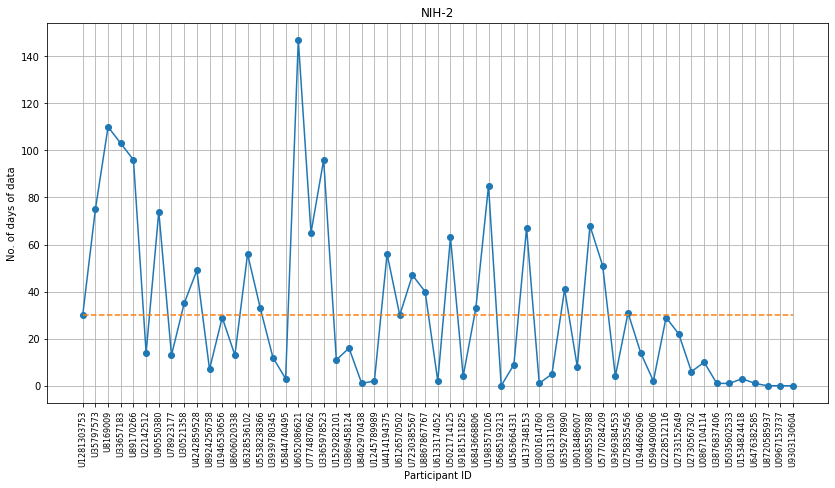

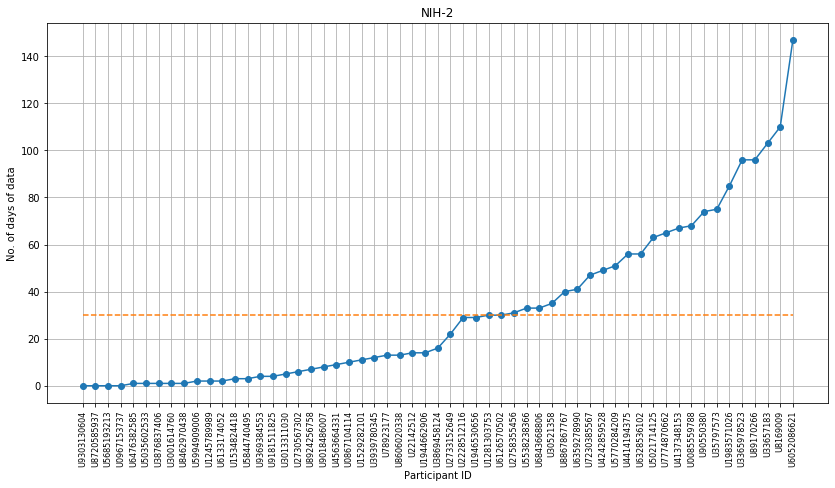

In [14]:
days_thres = 30;
f=plt.figure(figsize=(14,7)); plt.plot(ID, ndays,'o-'); plt.plot(days_thres*np.ones_like(ndays),'--'); plt.xticks(rotation='vertical', size=8); plt.grid()
plt.xlabel('Participant ID'); plt.ylabel('No. of days of data'); plt.title('NIH-2'); plt.savefig('Figures/days_per_subj.png'); plt.show(); 

sort_idx = np.argsort(ndays); #np.arange(0,len(ndays));
f=plt.figure(figsize=(14,7)); plt.plot(ID[sort_idx], ndays[sort_idx],'o-'); plt.plot(days_thres*np.ones_like(ndays),'--'); plt.xticks(rotation='vertical', size=8); plt.grid()
plt.xlabel('Participant ID'); plt.ylabel('No. of days of data'); plt.title('NIH-2'); plt.savefig('Figures/days_per_subj_sorted.png'); plt.show(); 

7 patients had relapse


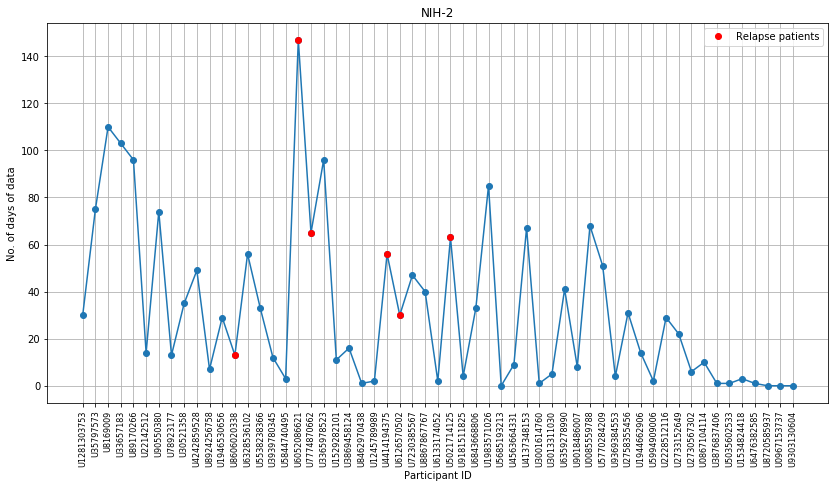

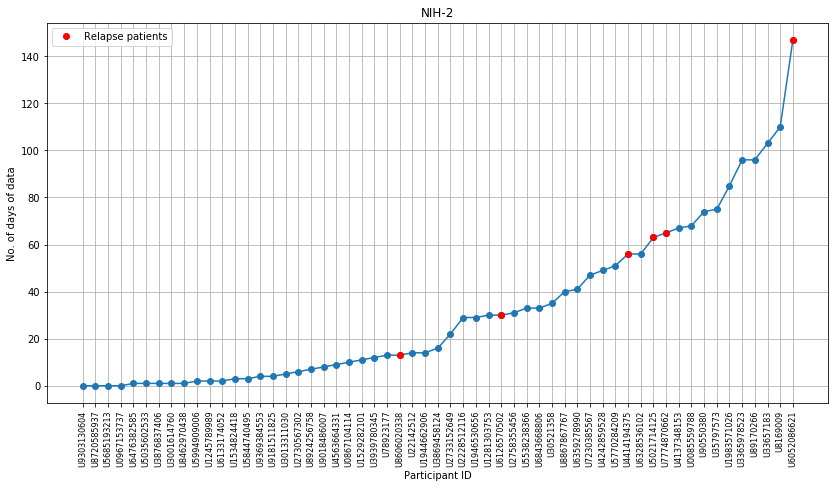

In [15]:
relapse_id=np.array(['U7774870662','U6052086621','U8606020338','U413734815',
                      'U5021714125','U4414194375','U6126570502']);
relapse_date = np.array([datetime.date(2021, 1, 15),datetime.date(2021, 1, 15),
                        datetime.date(2020, 11, 15),datetime.date(2021, 2, 8),
                        datetime.date(2021, 2, 11),datetime.date(2021, 2, 18),
                        datetime.date(2021, 1, 31)],dtype='object');
nrelapse = len(relapse_id); print(f'{nrelapse:d} patients had relapse');
re_id = [];
for idf, jdf in enumerate(relapse_id): #subdat_df['ID']):
    idx = np.where(ID == jdf)[0];
    if len(idx)>0:
        re_id.append(idx[0]);
re_id = np.array(re_id);
    
        
f=plt.figure(figsize=(14,7)); plt.plot(ID, ndays,'o-'); plt.plot(ID[re_id],ndays[re_id],'o',color='red',label='Relapse patients'); plt.xticks(rotation='vertical', size=8); plt.grid();
plt.xlabel('Participant ID'); plt.ylabel('No. of days of data'); plt.title('NIH-2'); plt.legend(); plt.savefig('Figures/Relapse.png'); plt.show();

sort_idx = np.argsort(ndays); #np.arange(0,len(ndays));
f=plt.figure(figsize=(14,7)); plt.plot(ID[sort_idx], ndays[sort_idx],'o-'); plt.plot(ID[re_id], ndays[re_id],'o',color='red',label='Relapse patients'); plt.xticks(rotation='vertical', size=8); plt.grid()
plt.xlabel('Participant ID'); plt.ylabel('No. of days of data'); plt.title('NIH-2'); plt.legend(); plt.savefig('Figures/Relapse_sorted.png');plt.show(); 

In [16]:
# Survey completeness
survey_completeness = np.empty(shape=(nsubj,),dtype='object');
for isubj in tqdm(range(nsubj)): 
    survey_completeness[isubj] = np.zeros(shape=(ndays[isubj],len(score_list)));
    for iday in range(ndays[isubj]):
        for iscore in range(len(score_list)):
            survey_completeness[isubj][iday,iscore] = 1-np.mean(np.isnan(true_resp[isubj][iday,idx_all[iscore]]));

# which_subj = 16;
# print(survey_completeness[which_subj])
# print(true_resp[which_subj])

100%|██████████| 57/57 [00:00<00:00, 214.03it/s]


/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


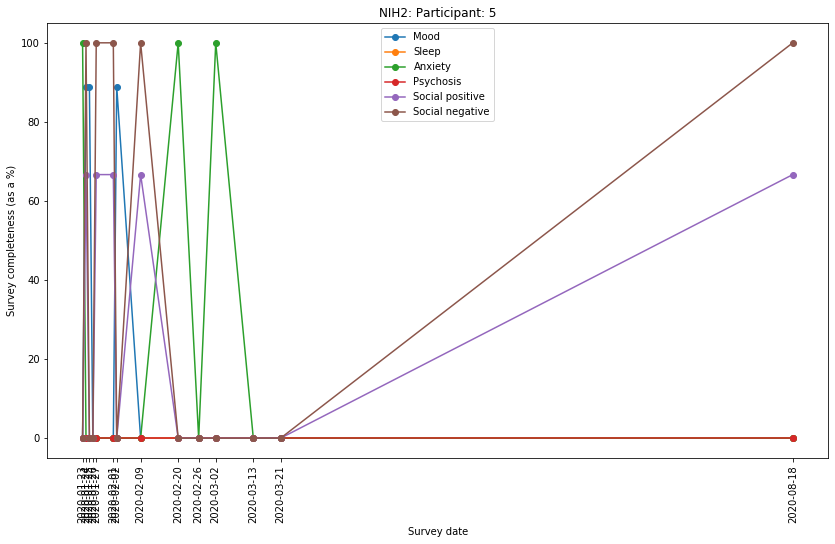

In [17]:
# Plot survey completion
which_subj = 5;
f=plt.figure(figsize=(14,8)); 
for iscore in range(len(score_list)):
    plt.plot(unique_dates[which_subj],survey_completeness[which_subj][:,iscore]*100,'o-',label=score_list[iscore]);
plt.xticks(unique_dates[which_subj], rotation='vertical')
plt.xlabel('Survey date'); plt.ylabel('Survey completeness (as a %)'); plt.legend(); plt.title(f'NIH2: Participant: {which_subj:d}'); plt.savefig(f'Figures/survey_completeness_{which_subj:d}'); plt.show()

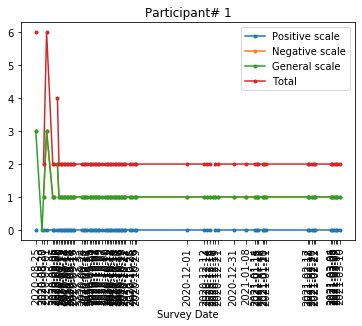

In [19]:
# Function to calculate and plot PANSS score 
def panss_score(true_resp, panss_idx):
    nsubj = len(true_resp);
    panss = np.empty(shape=(nsubj,),dtype='object');
    for isubj in range(nsubj):
        panss[isubj] = np.zeros(shape=(len(true_resp[isubj]),len(panss_idx)))-1;

        for ipanss in range(len(panss_idx)):
            for iday in range(len(true_resp[isubj])):
                panss[isubj][iday,ipanss] = np.nansum(true_resp[isubj][iday,panss_idx[ipanss]]);
                if np.all(np.isnan(true_resp[isubj][iday,panss_idx[ipanss]])):
                    panss[isubj][iday,ipanss] = float('nan')

    return panss;

panss = panss_score(true_resp, panss_idx); 

which_subj = 1;
panss_desc = ['Positive scale','Negative scale','General scale'];
f=plt.figure();
for i in range(len(panss_desc)):
    plt.plot(unique_dates[which_subj],panss[which_subj][:,i],'.-',label=panss_desc[i]); 
plt.plot(unique_dates[which_subj], np.sum(panss[which_subj],axis=1),'.-',label='Total'); 
plt.xticks(unique_dates[which_subj], rotation='vertical')
plt.legend(); plt.xlabel('Survey Date'); plt.xticks(rotation='vertical'); plt.title(f'Participant# {which_subj}');
plt.savefig('Figures/panss_1.png') 

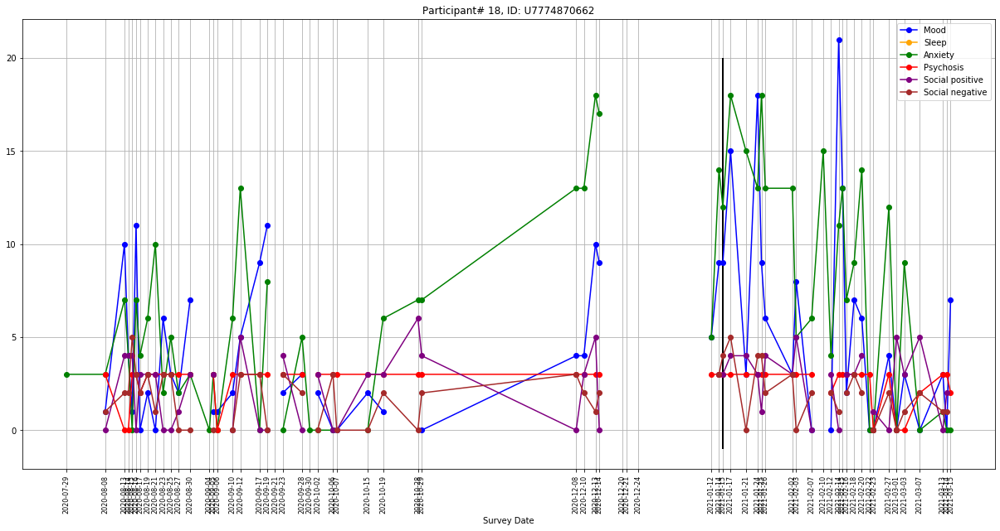

In [20]:
# Function to calculate mood, sleep, anxiety, social, psychosis scores
# TODO: Check actual scores carefully

def all_score(true_resp, idx_all):

    # idx_all is (5,) array with each element differently sized
    nscores = len(idx_all); nsubj=len(true_resp);
    score = np.empty(shape=(nsubj,),dtype='object');

    for isubj in range(nsubj):
        ndays = len(true_resp[isubj])
        score[isubj] = np.empty(shape=(ndays,nscores))
        for iscore in range(nscores):
            for iday in range(ndays):
                score[isubj][iday, iscore] = np.nansum(true_resp[isubj][iday,idx_all[iscore]]);
                # If there is no data at all, keep it nan
                if np.all(np.isnan(true_resp[isubj][iday,idx_all[iscore]])):
                    score[isubj][iday,iscore] = float('nan')
            

    return score


score = all_score(true_resp,idx_all);

more_data = np.where(ndays>=days_thres)[0];

which_subj=re_id[0];
f=plt.figure(figsize=(21,10));
for i_item, item in enumerate(score_list):
    plt.plot(unique_dates[which_subj],score[which_subj][:,i_item],'o-',label=item,color=color_list[i_item]); 
    plt.vlines(relapse_date[0],-1,20);
    kk=list(20*50**(survey_completeness[which_subj][:,i_item]));
    #plt.scatter(unique_dates[which_subj],score[which_subj][:,i_item],c=color_list[i_item], s=kk); 
    
plt.xticks(unique_dates[which_subj],size=8,rotation='vertical'); plt.grid();
plt.legend(); plt.xlabel('Survey Date'); plt.xticks(); plt.title(f'Participant# {which_subj}, ID: {ID[which_subj]}');
plt.savefig(f'Figures/sur_score_{which_subj:d}.png') 
            

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  


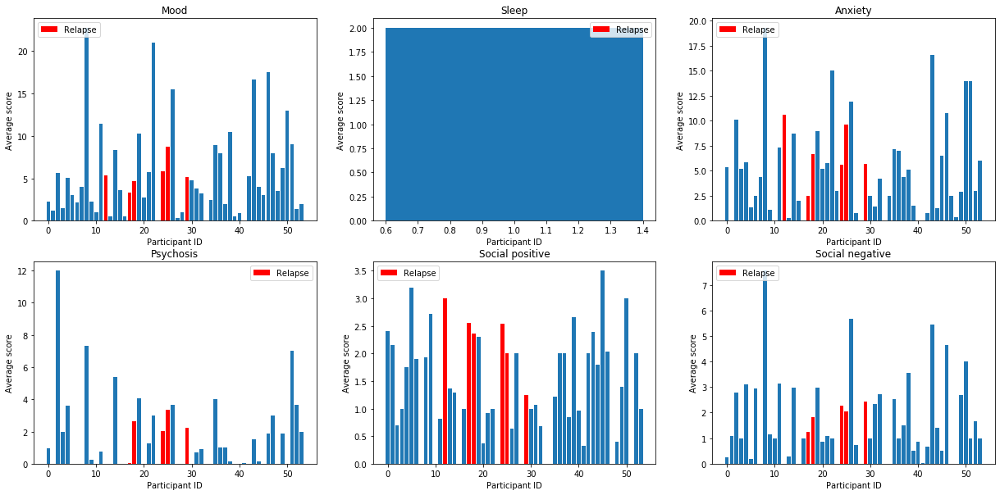

In [21]:
''' Is average survey score indicate likelihood of relapse
'''
nscore=len(score_list)
re_mood = np.zeros(shape=(nsubj,nscore));
f=plt.figure(figsize=(21,10)); 
for iscore in range(nscore):
    for isubj in range(nsubj):
        re_mood[isubj,iscore] = np.nanmean(score[isubj][:,iscore]);
    plt.subplot(2,3,iscore+1);plt.bar(np.arange(0,nsubj),re_mood[:,iscore]); plt.bar(re_id,re_mood[re_id,iscore],color='red', label='Relapse'); 
    plt.title(score_list[iscore]); plt.ylabel('Average score'); plt.xlabel('Participant ID'); plt.legend();    

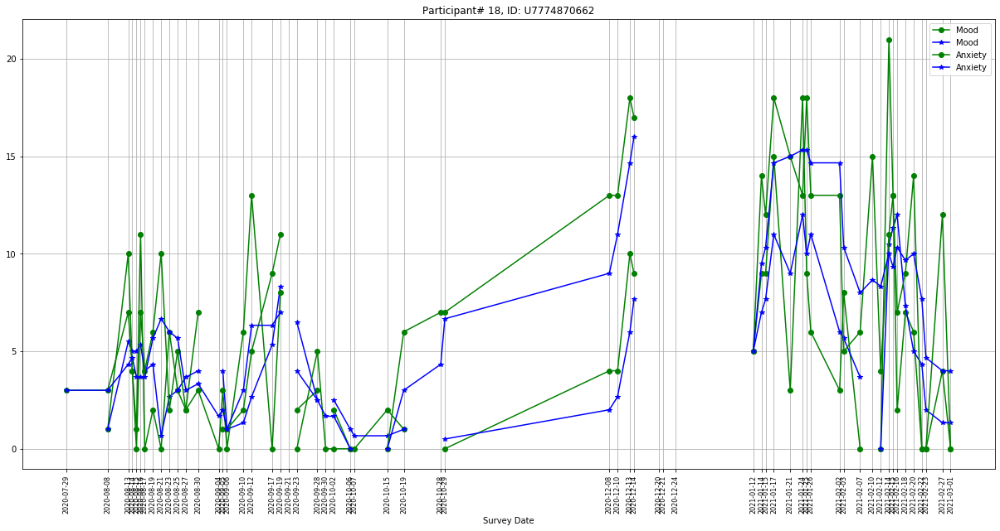

In [397]:
def moving_average(signal, n=3):
    signal = np.flip(signal); # data is stored from last date to early date. Need to flip before and after
    
    ret = np.cumsum(signal.filled(0));
    ret[n:] = ret[n:] - ret[:-n]
    counts = np.cumsum(~signal.mask)
    counts[n:] = counts[n:] - counts[:-n]
    ret[~signal.mask] /= counts[~signal.mask]
    ret[signal.mask] = np.nan
    
    ret = np.flip(ret)
    return ret


which_subj=re_id[0];
f=plt.figure(figsize=(21,10));
for i_item, item in enumerate(score_list):
    if i_item == 2 or i_item == 0:
        x=score[which_subj][:,i_item]; mx=np.ma.masked_array(x,np.isnan(x)); 
        ma=moving_average(mx);
        plt.plot(unique_dates[which_subj],score[which_subj][:,i_item],'o-',label=item,color='green');
        plt.plot(unique_dates[which_subj],ma,'*-',label=item,color='blue'); 
        kk=list(20*50**(survey_completeness[which_subj][:,i_item]));
        #plt.scatter(unique_dates[which_subj],score[which_subj][:,i_item],c=color_list[i_item], s=kk); 
    
plt.xticks(unique_dates[which_subj],size=8,rotation='vertical'); plt.grid();
plt.legend(); plt.xlabel('Survey Date'); plt.xticks(); plt.title(f'Participant# {which_subj}, ID: {ID[which_subj]}');
plt.savefig(f'Figures/sur_score_{which_subj:d}.png') 
  

In [22]:
#unique_dates (datetime64 type) cannot be saved as a mat file, so convert to string
unique_dates_mat = np.empty_like(unique_dates)
for i in range(len(unique_dates)):
    unique_dates_mat[i] = np.empty_like(unique_dates[i]);
    for j,dd in enumerate(unique_dates[i]):
        unique_dates_mat[i][j] = dd.strftime("%d-%b-%Y");

In [23]:
# Convert Data from Python to MATLAB
mat_data={'true_resp':true_resp,'idx_all':idx_all,'ques_all':ques_all,'unique_dates_mat':unique_dates_mat};
io.savemat('NIH2.mat',mat_data);
print('---------------------------- Done ---------------------------')

---------------------------- Done ---------------------------


In [24]:
def corr_with_nan(A,B):
    a=np.ma.masked_invalid(A);
    b=np.ma.masked_invalid(B);
    msk = (~a.mask & ~b.mask);
    r,p=stats.pearsonr(a[msk],b[msk]); 
    return r, p

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:3399: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


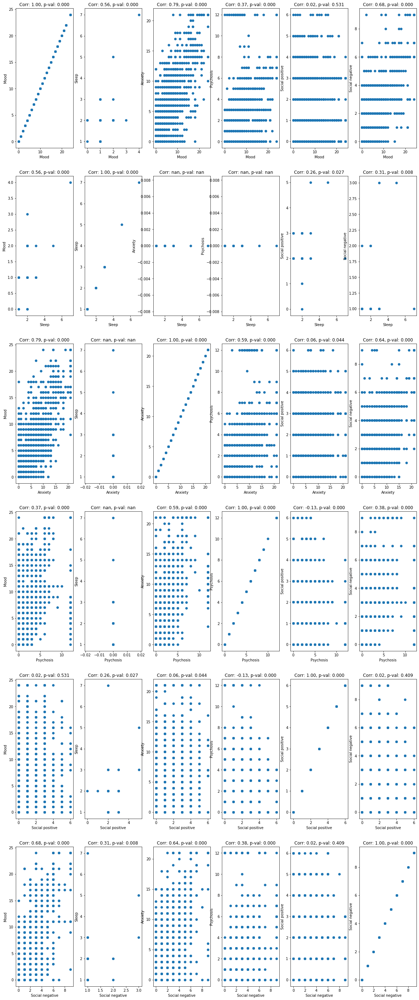

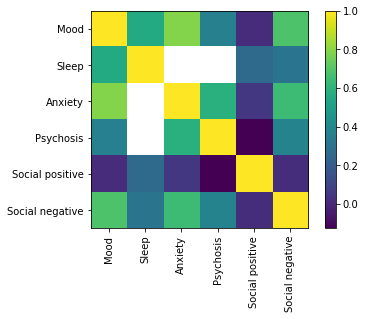

In [25]:
''' Check correlations between scores of each type, ie., Mood vs Anxiety, Anxiety vs Sleep etc
'''

all_scores = np.empty(shape=(len(score_list),),dtype='object');

# Collect scores across all patients
for i_score in range(len(score_list)):
    kk=[];
    for i_subj in range(nsubj):
        kk.append(score[i_subj][:,i_score].tolist());
    all_scores[i_score] = kk;

# This loop makes all_scores a weird list of lists. Use 'itertools' to unpack that
for i_score in range(len(score_list)):
    all_scores[i_score] = list(itertools.chain(*all_scores[i_score]));

# Measure correlation across individual pairs
k=1; plt.figure(figsize=(20,50));
[corr_scores, p_corr] = [np.zeros(shape=(len(score_list), len(score_list))) for _ in range(2)]
for i_score in range(len(score_list)):
    for j_score in range(len(score_list)):
        # if i_score==1 and j_score==2:
        #     pdb.set_trace();
        [corr_scores[i_score,j_score],p_corr[i_score,j_score]] = corr_with_nan(all_scores[i_score], all_scores[j_score]);
        plt.subplot(6,6,k); plt.scatter(all_scores[i_score], all_scores[j_score]); plt.xlabel(score_list[i_score])
        plt.ylabel(score_list[j_score]); 
        plt.title(f'Corr: {corr_scores[i_score,j_score]:0.2f}, p-val: {p_corr[i_score,j_score]:0.3f}');
        k=k+1;
plt.savefig('Figures/Corr.png')
plt.show();

# Show correlation values as an image
f=plt.figure();  
plt.imshow(corr_scores); plt.colorbar(); plt.xticks(np.arange(0,len(score_list)),score_list,rotation='vertical');
plt.yticks(np.arange(0,len(score_list)),score_list); plt.savefig('Figures/corr_img.png')
plt.show();



In [57]:
print(mean_score[:,1])
corr_with_nan(mean_score[:,0], mean_score[:,1])

[nan  2. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan]


ValueError: x and y must have length at least 2.

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  


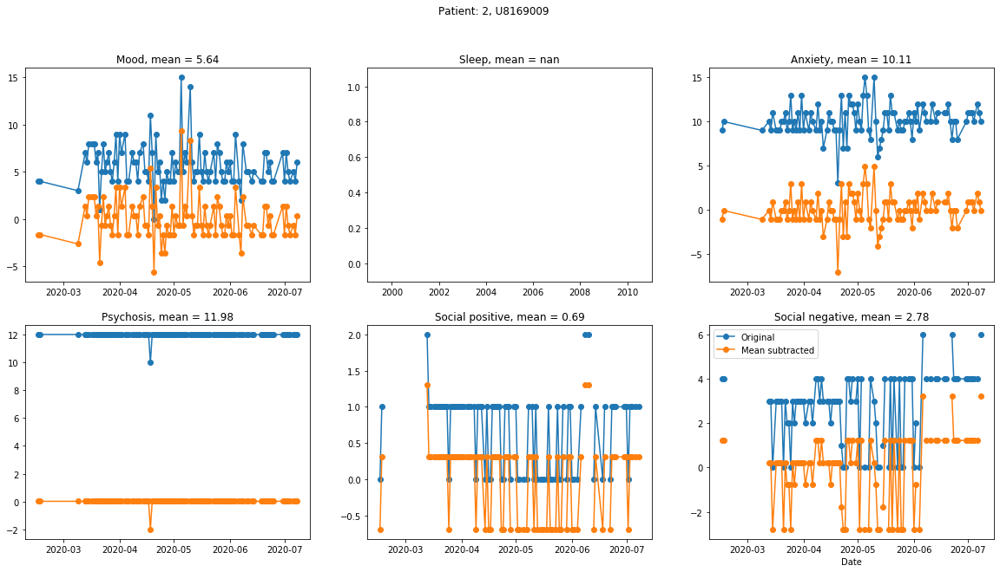

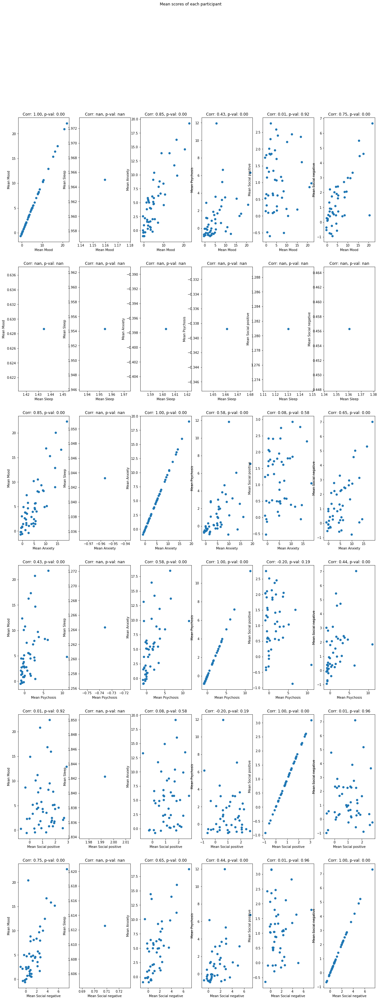

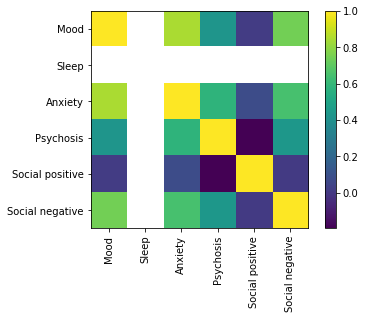

In [72]:
''' In order to look more closely at day-to-day fluctuations, subtract out the mean from participants' score 
'''
norm_score = np.empty(shape=(score.shape),dtype='object');
mean_score = np.empty(shape=(score.shape[0],len(score_list)));
for isubj in range(nsubj):
    mean_score[isubj,] = np.nanmean(score[isubj],axis=0);
    norm_score[isubj] = score[isubj] - mean_score[isubj];

[rm_corr, pm_corr] = [np.zeros(shape=(len(score_list),len(score_list))) for _ in range(2)]
which_subj=2; 
f=plt.figure(figsize=(20,10))
for i_score in range(len(score_list)):
    plt.subplot(2,3,i_score+1);
    plt.plot(unique_dates[which_subj], score[which_subj][:,i_score],'o-',label='Original'); #plt.xticks(unique_dates[which_subj],rotation='vertical'); 
    plt.plot(unique_dates[which_subj], norm_score[which_subj][:,i_score],'o-',label='Mean subtracted');
    plt.title(f'{score_list[i_score]}, mean = {mean_score[which_subj,i_score]:0.2f}');
    
    for j_score in range(len(score_list)):
        if j_score==1 or i_score==1:
            rm_corr[i_score,j_score]=float('nan'); pm_corr[i_score,j_score]=float('nan')
            continue;
        [rm_corr[i_score,j_score],pm_corr[i_score,j_score]] = corr_with_nan(mean_score[:,i_score],mean_score[:,j_score]);

plt.xlabel('Date'); 
plt.legend(); plt.suptitle(f'Patient: {which_subj:d}, {ID[which_subj]}'); plt.show();

# Plot mean_scores data
f=plt.figure(figsize=(20,50)); k=0;
for i_score in range(len(score_list)):
    for j_score in range(len(score_list)):
        k=k+1; rand_idx=np.random.uniform(-1,0,nsubj)
        plt.subplot(6,6,k); plt.scatter(mean_score[:,i_score]+rand_idx, mean_score[:,j_score]+rand_idx); plt.xlabel(f'Mean {score_list[i_score]}');
        plt.ylabel(f'Mean {score_list[j_score]}'); plt.title(f'Corr: {rm_corr[i_score, j_score]:0.2f}, p-val: {pm_corr[i_score,j_score]:0.2f}')
plt.suptitle('Mean scores of each participant')
        
# Plot correlogram of mean scores
f=plt.figure(); plt.imshow(rm_corr); plt.colorbar(); plt.xticks(np.arange(0,len(score_list)),score_list,rotation='vertical');
plt.yticks(np.arange(0,len(score_list)),score_list); 
plt.show();



In [69]:
mean_score[isubj]

array([nan, nan, nan, nan, nan, nan])

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """


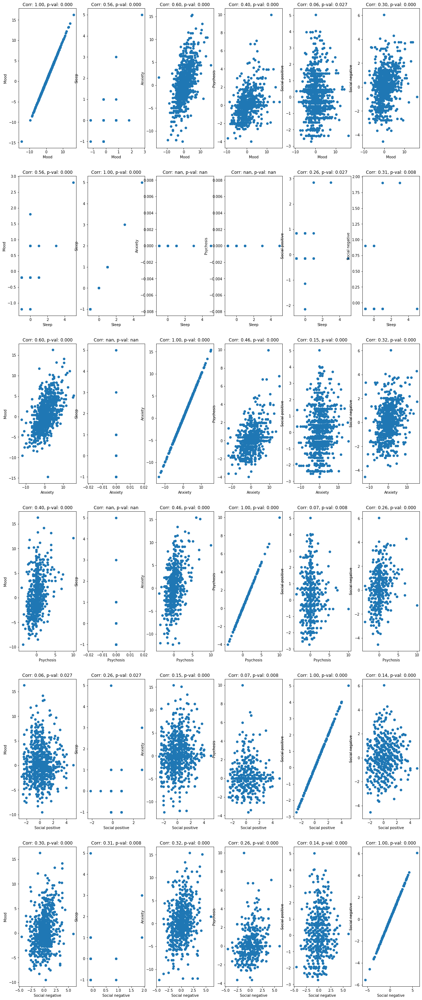

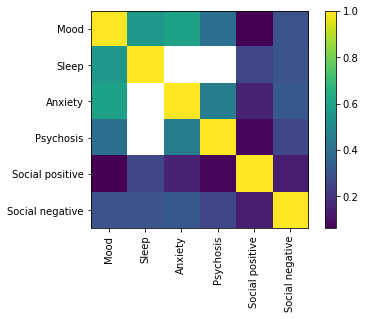

In [26]:
''' Correlate normalised scores
'''

all_norm_scores = np.empty(shape=(len(score_list),),dtype='object');

# Collect scores across all patients
for i_score in range(len(score_list)):
    kk=[];
    for i_subj in range(nsubj):
        kk.append(norm_score[i_subj][:,i_score].tolist());
    all_norm_scores[i_score] = kk;

# This loop makes all_scores a weird list of lists. Use 'itertools' to unpack that
for i_score in range(len(score_list)):
    all_norm_scores[i_score] = list(itertools.chain(*all_norm_scores[i_score]));

# Measure correlation across individual pairs
k=1; plt.figure(figsize=(20,50));
[corr_scores, p_corr] = [np.zeros(shape=(len(score_list), len(score_list))) for _ in range(2)]
for i_score in range(len(score_list)):
    for j_score in range(len(score_list)):
        # if i_score==1 and j_score==2:
        #     pdb.set_trace();
        [corr_scores[i_score,j_score],p_corr[i_score,j_score]] = corr_with_nan(all_norm_scores[i_score], all_norm_scores[j_score]);
        plt.subplot(6,6,k); plt.scatter(all_norm_scores[i_score], all_norm_scores[j_score]); plt.xlabel(score_list[i_score])
        plt.ylabel(score_list[j_score]); 
        plt.title(f'Corr: {corr_scores[i_score,j_score]:0.2f}, p-val: {p_corr[i_score,j_score]:0.3f}');
        k=k+1;
plt.savefig('Figures/Norm_corr.png')
plt.show();

# Show correlation values as an image
f=plt.figure();  
plt.imshow(corr_scores); plt.colorbar(); plt.xticks(np.arange(0,len(score_list)),score_list,rotation='vertical');
plt.yticks(np.arange(0,len(score_list)),score_list); plt.savefig('Figures/corr_img.png')
plt.show();




Size (all_wkday): 1824, and size (all_norm_scores): 1824


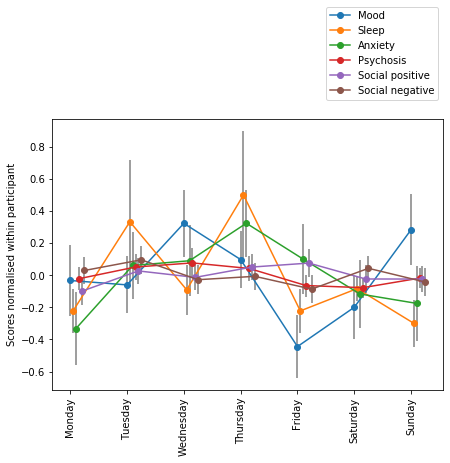

In [155]:
''' Effect of day of week on survey report'''

wkday = np.empty(shape=(unique_dates.shape),dtype='object');
all_wkday = [];
for isubj in range(nsubj):
    wkday[isubj] = np.empty(shape=(unique_dates[isubj].shape),dtype='int');
    for iday,jday in enumerate(unique_dates[isubj]):
        wkday[isubj][iday] = int(jday.weekday());
        all_wkday.append(wkday[isubj][iday]);

all_wkday = np.array(all_wkday)
print(f'Size (all_wkday): {len(all_wkday)}, and size (all_norm_scores): {np.size(all_norm_scores[0])}');

# Collect scores by weekday
wk_list = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
wk_norm_score = np.empty(shape=(len(score_list),),dtype='object');
mean_norm_score_wk, sem_norm_score_wk = [np.empty(shape=(len(score_list),7)) for _ in range(2)];

f=plt.figure(figsize=(7,5));
for iscore in range(len(score_list)):
    norm_ss = np.array(all_norm_scores[iscore]);
    wk_norm_score[iscore] = np.empty(shape=(7,),dtype='object');
    for iwk in range(7):
        wk_norm_score[iscore][iwk] = norm_ss[np.where(all_wkday==iwk)[0]];
        mean_norm_score_wk[iscore,iwk] = np.nanmean(wk_norm_score[iscore][iwk]);
        sem_norm_score_wk[iscore,iwk] = np.nanstd(wk_norm_score[iscore][iwk])/np.sqrt(np.sum(~np.isnan(wk_norm_score[iscore][iwk])));
        
    plt.plot(np.arange(0,7)+iscore/20,mean_norm_score_wk[iscore,],'o-',label=score_list[iscore]); 
    plt.errorbar(np.arange(0,7)+iscore/20,mean_norm_score_wk[iscore,],sem_norm_score_wk[iscore,],ls='',color='grey');plt.grid();
    plt.xticks(np.arange(0,7),wk_list,rotation='vertical');
    
plt.legend(loc='lower right',bbox_to_anchor=(1, 1.05)); plt.ylabel('Scores normalised within participant'); plt.show();
    


In [27]:
#### PASSIVE DATA ANALYSIS ######

In [146]:
fname = 'U35797573_gps.csv'; #'nih2_gps/U35797573_gps.csv';
df = pd.read_csv(fname); print(df)

        Unnamed: 0      timestamp   latitude  longitude
0                0  1611785367867  42.283373 -71.064843
1                1  1611785367862  42.283373 -71.064843
2                2  1611785338854  42.283373 -71.064841
3                3  1611785338853  42.283373 -71.064841
4                4  1611785332900  42.283373 -71.064843
5                5  1611785332889  42.283373 -71.064843
6                6  1611785314873  42.283373 -71.064843
7                7  1611785314865  42.283373 -71.064843
8                8  1611785309899  42.283373 -71.064844
9                9  1611785309895  42.283373 -71.064844
10              10  1611785292870  42.283372 -71.064836
11              11  1611785292869  42.283372 -71.064836
12              12  1611785286875  42.283372 -71.064837
13              13  1611785286874  42.283372 -71.064837
14              14  1611785266872  42.283372 -71.064838
15              15  1611785266868  42.283372 -71.064838
16              16  1611785246882  42.283372 -71

In [147]:
df.to_pickle("nih2_gps/exdat.pkl")

FileNotFoundError: [Errno 2] No such file or directory: 'nih2_gps/exdat.pkl'

In [42]:
pd.read_csv('nih2_gps/U35797573_gps.csv')
df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
df = df.iloc[::-1]
df = df.reset_index(drop=True)
tlist = []
for i in range(1,len(df)):
    t = df['timestamp'][i] - df['timestamp'][i-1]
    tlist.append(t.seconds)
print(np.median(tlist)); print(np.mean(tlist));

7.0
8.053738536090457


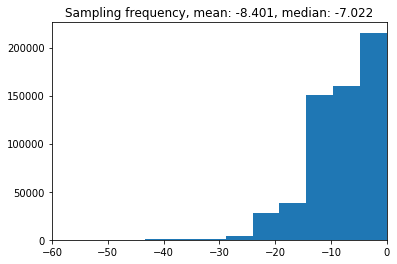

In [49]:
plt.hist(np.diff(df['timestamp']/1e3),bins=10000); plt.xlim([-60,0]);
mn = np.mean(np.diff(df['timestamp']/1e3)); md = np.median(np.diff(df['timestamp']/1e3))
plt.title(f'Sampling frequency, mean: {mn:1.3f}, median: {md:1.3f}');
plt.show()

In [148]:
# Add additional columns to the data frame with day-time and weekday
dat_colm = pd.to_datetime(df['timestamp'],unit='ms'); df['Date-Time'] = dat_colm;
#df.insert(2,'Date-Time',dat_colm); 
weekday = df['Date-Time'].dt.day_name(); df['Day of week'] = weekday;
#df.insert(3,'Day of week',weekday,True)

#df.drop(columns=['Date','date']); #del df['date']
#del df['Day of week']
print(df.head())

   Unnamed: 0      timestamp               Date-Time Day of week   latitude  \
0           0  1611785367867 2021-01-27 22:09:27.867   Wednesday  42.283373   
1           1  1611785367862 2021-01-27 22:09:27.862   Wednesday  42.283373   
2           2  1611785338854 2021-01-27 22:08:58.854   Wednesday  42.283373   
3           3  1611785338853 2021-01-27 22:08:58.853   Wednesday  42.283373   
4           4  1611785332900 2021-01-27 22:08:52.900   Wednesday  42.283373   

   longitude  
0 -71.064843  
1 -71.064843  
2 -71.064841  
3 -71.064841  
4 -71.064843  


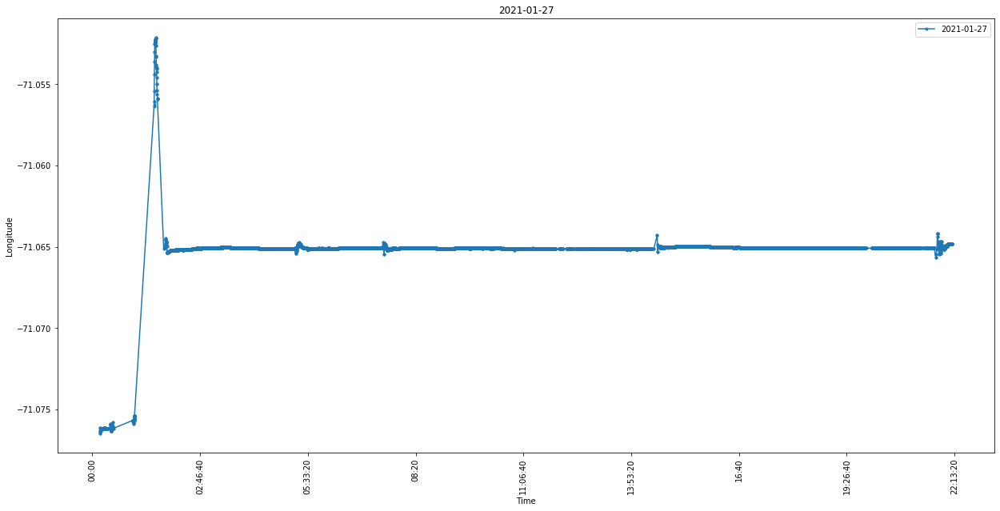

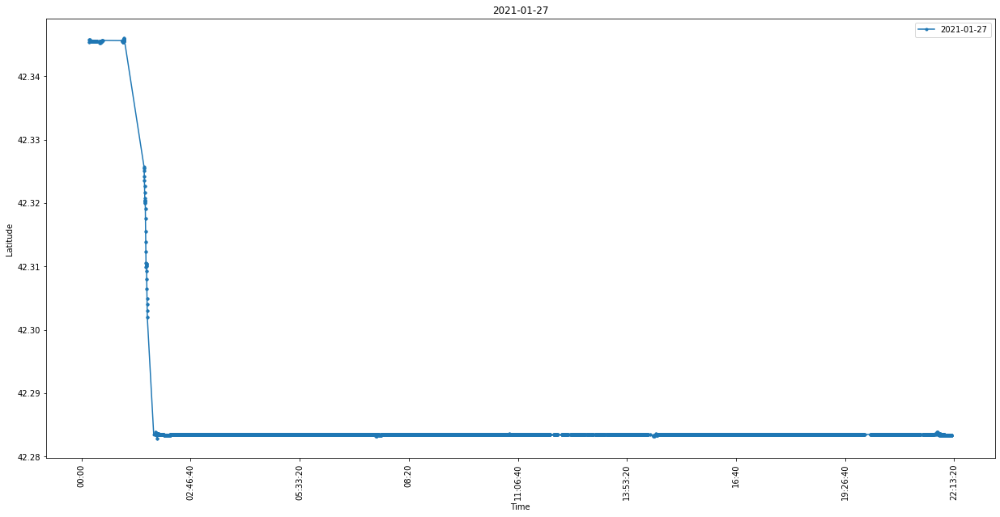

In [51]:
# Find lat. long. on one day
f=plt.figure(figsize=(21,10))
days = df['Date-Time'].dt.date; 

days=days[0]; # For debugging, delete later
for iday,gday in enumerate(np.unique(days)):
    lon = df['longitude'][df['Date-Time'].dt.date == gday];
    tm = df['Date-Time'][df['Date-Time'].dt.date == gday].dt.time;
    #plt.figure(figsize=(21,10));
    plt.plot(tm, lon,'.-',label=gday); plt.xticks(rotation='vertical');
    plt.ylabel('Longitude'); plt.xlabel('Time'); plt.title(f'{gday}')
plt.legend(); plt.show();


f=plt.figure(figsize=(21,10))
 
for iday,gday in enumerate(np.unique(days)):
    lon = df['latitude'][df['Date-Time'].dt.date == gday];
    tm = df['Date-Time'][df['Date-Time'].dt.date == gday].dt.time;
    #plt.figure(figsize=(21,10));
    plt.plot(tm, lon,'.-',label=gday); plt.xticks(rotation='vertical');
    plt.ylabel('Latitude'); plt.xlabel('Time'); plt.title(f'{gday}')
plt.legend(); plt.show();

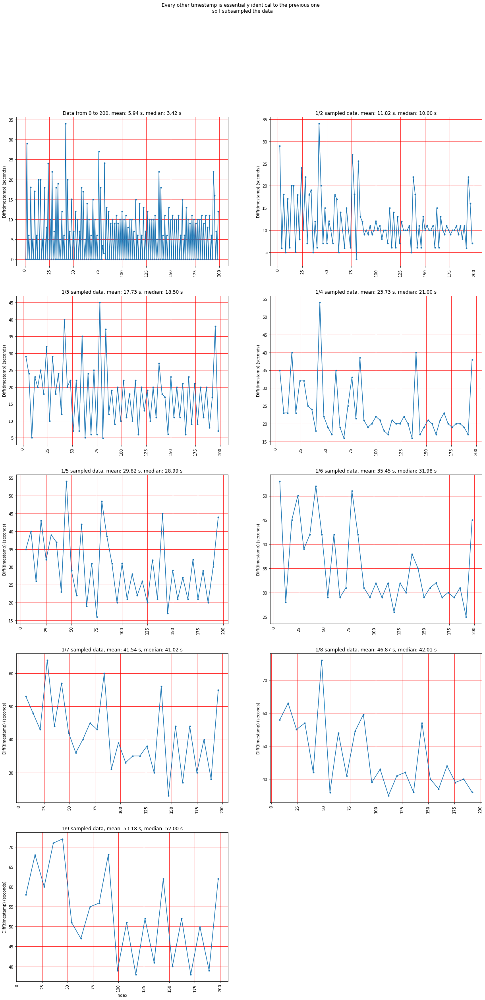

In [149]:
'''Sampling times are repeated, ie., duplicate readings are taken after every other reading. 
'''
f=plt.figure(figsize=(21,40))
days = df['Date-Time'].dt.date; 

days = days[0]; 

sub_samples = np.arange(1,10)
startidx = 0; endidx = 200; # Start with a few points to see how to interpolate. Extend this later: TR Jan 29
xx = np.arange(startidx,endidx);

for iday,gday in enumerate(np.unique(days)):
    tm = df['timestamp'][df['Date-Time'].dt.date == gday][startidx:endidx]/1e3;#.dt.time;
    
    for isub,jsub in enumerate(sub_samples):
        xxisub = xx[::jsub]; xxisub=xxisub[1:]
        yyisub = -np.diff(tm[::jsub]);
        
#         if isub==2:
#             pdb.set_trace();
        plt.subplot(5,2,isub+1); plt.plot(xxisub,yyisub,'.-'); plt.xticks(rotation='vertical'); 
        plt.ylabel('Diff(timestamp) (seconds)'); 
        
        if isub==0:
            plt.title(f'Data from {startidx} to {endidx}, mean: {np.mean(yyisub):0.2f} s, median: {np.median(yyisub):0.2f} s'); plt.grid(b=True, which='major',color='r',linestyle='-');
        else:
            plt.title(f'1/{jsub:d} sampled data, mean: {np.mean(yyisub):0.2f} s, median: {np.median(yyisub):0.2f} s'); plt.grid(b=True, which='major',color='r',linestyle='-');
        
plt.grid(b=True, which='minor',color='r',linestyle='--'); 
plt.xlabel('Index'); plt.suptitle('Every other timestamp is essentially identical to the previous one \n so I subsampled the data')
    
plt.savefig('Figures/ts_diff.png'); plt.show();


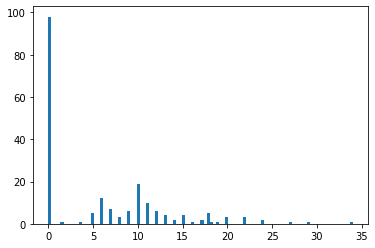

[98  0  0  0  1  0  0  0  0  0  1  0  0  0  5  0  0 12  0  0  7  0  0  3
  0  0  6  0  0 19  0  0 10  0  0  6  0  0  4  0  0  2  0  0  4  0  0  1
  0  0  2  0  5  1  0  1  0  0  3  0  0  0  0  0  3  0  0  0  0  0  2  0
  0  0  0  0  0  0  0  1  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0
  0  0  0  1]
[ 0.          0.33991     0.67982     1.01973     1.35964     1.69955
  2.03946     2.37937     2.71927999  3.05918999  3.39909999  3.73900999
  4.07891999  4.41882999  4.75873999  5.09864999  5.43855999  5.77846999
  6.11837999  6.45828999  6.79819999  7.13810999  7.47801999  7.81792999
  8.15783998  8.49774998  8.83765998  9.17756998  9.51747998  9.85738998
 10.19729998 10.53720998 10.87711998 11.21702998 11.55693998 11.89684998
 12.23675998 12.57666998 12.91657998 13.25648998 13.59639997 13.93630997
 14.27621997 14.61612997 14.95603997 15.29594997 15.63585997 15.97576997
 16.31567997 16.65558997 16.99549997 17.33540997 17.67531997 18.01522997
 18.35513997 18.69504997 19.03495996 19.

In [155]:
tm = df['timestamp'][df['Date-Time'].dt.date == gday][startidx:endidx]/1e3;
plt.hist(-np.diff(tm),bins=100); plt.show(); 

y,x = np.histogram(-np.diff(tm),bins=100); print(y); print(x)

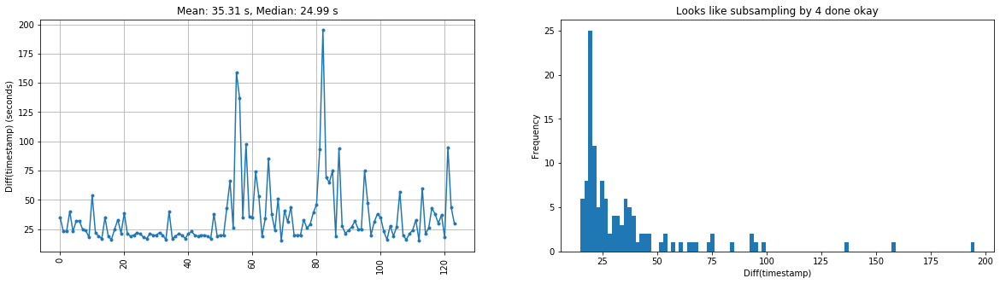

In [69]:
''' Due to the repeated sampling of data, sub-sampled by a fixed factor
'''
sample_factor = 4;
df2 = df[df.index % sample_factor == 0];

days = df2['Date-Time'].dt.date; days=days[0]; 

startidx = 0; endidx = 500//sample_factor; # Start with a few points to see how to interpolate. Extend this later: TR Jan 29
xx = np.arange(startidx,endidx-1);

f=plt.figure(figsize=(20,5))
for iday,gday in enumerate(np.unique(days)):
    tm = df2['timestamp'][df2['Date-Time'].dt.date == gday][startidx:endidx]/1e3;#.dt.time;
    yy = -np.diff(tm);
    
    plt.subplot(121); plt.plot(xx,yy,'.-'); plt.xticks(rotation='vertical'); plt.grid();
    plt.ylabel('Diff(timestamp) (seconds)'); 
    plt.title(f'Mean: {np.mean(yy):0.2f} s, Median: {np.median(yy):0.2f} s')
    
    plt.subplot(122); plt.hist(yy,bins=100); plt.ylabel('Frequency'); plt.xlabel('Diff(timestamp)');
    plt.title(f'Looks like subsampling by {sample_factor:d} done okay')

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Adding an axes using the same argumen

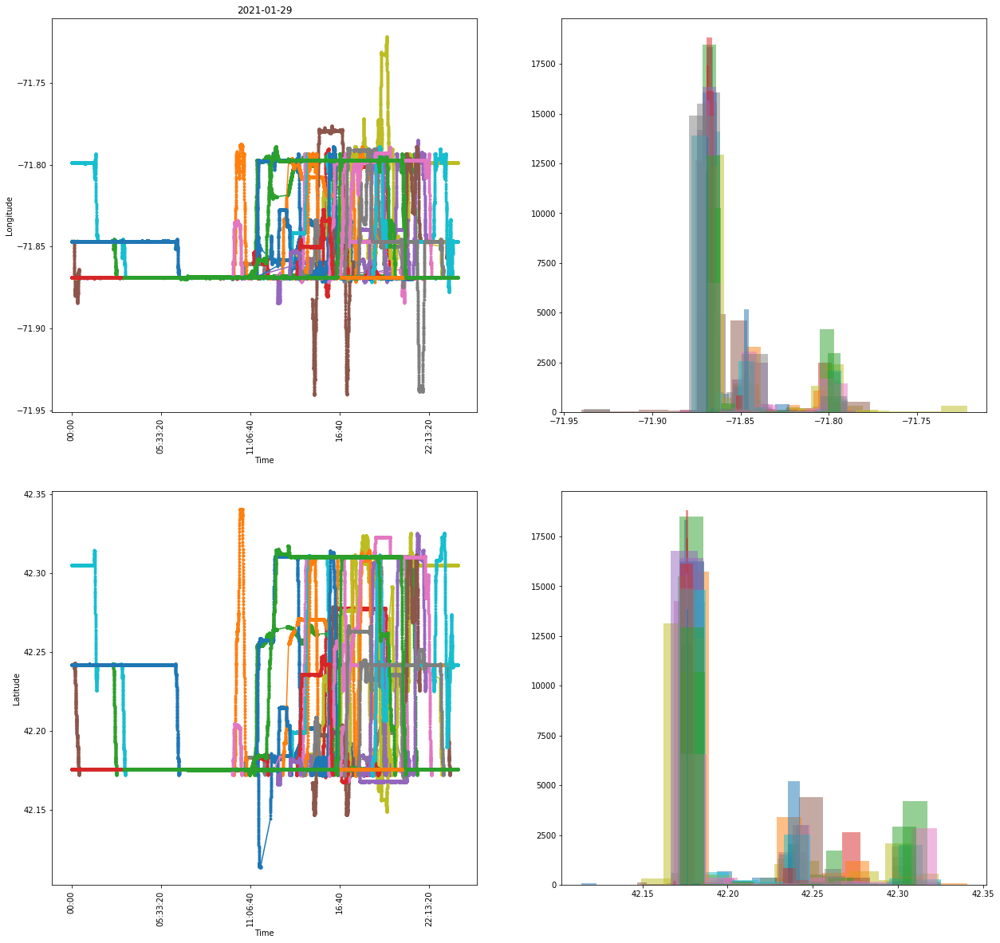

In [151]:
''' Plot lat. and long. for sub-sampled data 
'''

# Find lat. long. on one day
df2 = subdat_df['gps_dat'][0]
f=plt.figure(figsize=(21,20))
days = df2['Date-Time'].dt.date; 

days = np.unique(days); # For debugging, delete later
for iday,gday in enumerate(days):
    lon = df2['longitude'][df2['Date-Time'].dt.date == gday];
    lat = df2['latitude'][df2['Date-Time'].dt.date == gday];
    tm = df2['Date-Time'][df2['Date-Time'].dt.date == gday].dt.time;
    dow = gday.weekday();
    #plt.figure(figsize=(21,10));
    plt.subplot(221); plt.plot(tm, lon,'.-',label=gday); plt.xticks(rotation='vertical'); plt.grid();
    plt.ylabel('Longitude'); plt.xlabel('Time'); plt.title(f'{gday}');
    
    plt.subplot(222); plt.hist(lon, alpha=0.5);
    
    plt.subplot(223); plt.plot(tm, lat, '.-', label=gday); plt.xticks(rotation='vertical'); plt.grid();
    plt.ylabel('Latitude'); plt.xlabel('Time');
    
    plt.subplot(224); plt.hist(lat, alpha=0.5);
    
#plt.legend(loc='center'); 
plt.show();

##### Determine 'home-time for each day'
##### 1. Identify mode of lat. and long. as home
##### 2. For each day, find the time spent at home

In [28]:
''' Functions to get home location and home time
'''
def get_home_state(df):
    
    df['rounded_lat'] = df['latitude'].apply(lambda x: round(x, 4))
    df['rounded_lon'] = df['longitude'].apply(lambda x: round(x, 4))
    
    lat_mode = df['rounded_lat'].mode()
    lon_mode = df['rounded_lon'].mode()
    
    center = (lat_mode[0], lon_mode[0])
    df['home_state'] = df.apply(lambda x: gen_home_state(x['latitude'], x['longitude'], center), axis=1)
    return df


def gen_home_state(lat, lon, center, R=50):
    if distance((lat, lon), center) < R:
        return 'home'
    else:
        return 'non-home'
    
    
def distance(c1, c2):
    '''
    c1: (tuple) Geo coordinate
    c2: (tuple) Geo Coordinate
    return: distance in meters
    '''
    R = 6378.137 # radius in kilometers
    dLat = c2[0] * math.pi / 180 - c1[0] * math.pi / 180
    dLon = c2[1] * math.pi / 180 - c1[1] * math.pi / 180
    a1 = math.sin(dLat / 2) * math.sin(dLat / 2)
    a2 = math.cos(c1[0] * math.pi / 180) * math.cos(c2[0] * math.pi / 180)
    a3 = math.sin(dLon / 2) * math.sin(dLon / 2)
    a = a1 + (a2 * a3)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    d = R * c
    
    return d * 1000

# Get % of home time
df3 = get_home_state(df2); #print(df3.head());

# Since timestamps are not always uniform, get diff from previous time point to assess home-time and outside time etc

del_t = np.concatenate((np.array([0.0]),np.diff(df3['timestamp']))); 
df3['del-t'] = del_t;

days = df3['Date-Time'].dt.date; 
days = np.unique(days); #days = days[20:21]; # choose specific dates to look at for debugging
ndays = len(days);
home_tm = np.zeros(shape=(ndays,));

f=plt.figure(figsize=(21,10));
for iday, gday in enumerate(days):
    
    idx_home = df3['home_state'][df3['Date-Time'].dt.date == gday] == 'home';
    del_t = df3['del-t'][df3['Date-Time'].dt.date == gday];
    
    home_tm[iday] = np.sum(del_t[idx_home])/np.sum(del_t);
    
    
    tm = df3['Date-Time'][df3['Date-Time'].dt.date == gday].dt.time;
    lon = df3['longitude'][df3['Date-Time'].dt.date == gday];
    lat = df3['latitude'][df3['Date-Time'].dt.date == gday];
    
    plt.subplot(121); plt.plot(tm,lat,'.-',label=gday); 
    plt.subplot(122); plt.plot(tm,lon,'.-',label=gday);

plt.legend();
f=plt.figure(figsize=(21,10));
plt.plot(days,home_tm,'-o'); plt.xticks(days,days,rotation='vertical'); plt.ylabel('Fraction of home time');
plt.grid(); plt.xlabel('Date'); plt.show();

NameError: name 'df2' is not defined

In [29]:
''' Make a data frame for survey scores:
(1) Make a dictionary with participant ID as key
(2) Add dataframe as value
    (2a) Dataframe consists of survey date and score items
'''
survey_ID_score = {'ID': [], 'survey':[]};

for i_subj in range(nsubj):
    
    tmp_dict = {};
    for i_score, j_score in enumerate(score_list):
        d = {j_score:score[i_subj][:,i_score]}
        tmp_dict.update(d); # print(tmp_dict);

    survey_dict = {'Date':unique_dates[i_subj]}; survey_dict.update(tmp_dict); #print(survey_dict)
    survey_df = pd.DataFrame(data=survey_dict); #print(survey_df.head());
    
    survey_ID_score['ID'].append(ID[i_subj]);
    survey_ID_score['survey'].append(survey_df);
    
print(survey_ID_score)

{'ID': ['U1281303753', 'U35797573', 'U8169009', 'U33657183', 'U89170266', 'U22142512', 'U90550380', 'U78923177', 'U30521358', 'U4242859528', 'U8924256758', 'U1946530656', 'U8606020338', 'U6328536102', 'U5538238366', 'U3939780345', 'U5844740495', 'U6052086621', 'U7774870662', 'U3365978523', 'U1529282101', 'U3869458124', 'U8462970438', 'U1245789989', 'U4414194375', 'U6126570502', 'U7230385567', 'U8867867767', 'U6133174052', 'U5021714125', 'U9181511825', 'U6843668806', 'U1983571026', 'U5685193213', 'U4563664331', 'U4137348153', 'U3001614760', 'U3013311030', 'U6359278990', 'U9018486007', 'U0085559788', 'U5770284209', 'U9369384553', 'U2758355456', 'U1944662906', 'U5994909006', 'U2228512116', 'U2733152649', 'U2730567302', 'U0867104114'], 'survey': [          Date  Mood  Sleep  Anxiety  Psychosis  Social positive  \
0   2020-08-04   4.0    NaN      3.0        1.0              1.0   
1   2020-08-02   1.0    NaN      0.0        NaN              2.0   
2   2020-07-25   0.0    NaN      0.0       

In [ ]:
print(survey_completeness[2])

[nan  1. nan nan nan nan nan nan nan nan nan nan  1. nan  1. nan  1. nan
 nan  2. nan  2. nan nan nan nan nan nan nan nan nan  1. nan nan nan nan
 nan nan nan  1. nan nan nan nan nan  1.  1.  2. nan nan  0.  1.  1. nan
 nan nan nan nan nan]


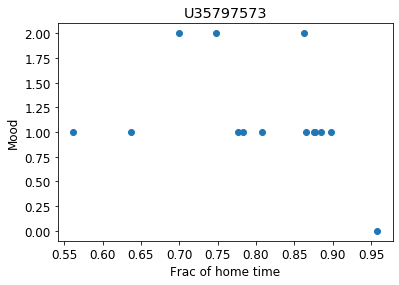

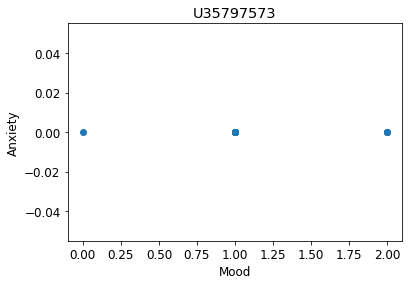

In [261]:
# For now, only work with participant whose passive data you have
testid = 'U35797573';
test_sur = survey_ID_score['survey'][survey_ID_score['ID'].index(testid)]; #print(test_sur)

home_tm_dict ={'Date':days, 'Home time': home_tm}
home_tm_df = pd.DataFrame(home_tm_dict); #print(home_tm_df)

mood, anx = [np.zeros(shape=(len(home_tm_df))) for _ in range(2)];
for i_date,j_date in enumerate(home_tm_df['Date']):
    date_idx = test_sur['Date'] == j_date; dd = test_sur['Date'][date_idx]; #print(f'{j_date}, {dd}');
    if len(dd) ==0:
        mood[i_date] = float('nan');
    else:
        mood[i_date] = test_sur[date_idx]['Mood']; anx[i_date] = test_sur[date_idx]['Anxiety'];

print(mood)
plt.plot(home_tm,mood,'o'); plt.xlabel('Frac of home time'); plt.ylabel('Mood'); plt.title(testid);

plt.show();

f = plt.figure(); plt.plot(mood, anx,'o'); plt.xlabel('Mood'); plt.ylabel('Anxiety'); 
plt.title(testid); plt.show();

In [416]:
#pip install tzwhere

     |████████████████████████████████| 23.7MB 793kB/s eta 0:00:01
     |████████████████████████████████| 1.0MB 332kB/s eta 0:00:01
  Stored in directory: /Users/tanviranjan/Library/Caches/pip/wheels/89/18/2f/01c958c82b1223d6fe763c6b2fadf45b4f6ce6e8a9fce7bbd5
Successfully built tzwhere
Note: you may need to restart the kernel to use updated packages.


In [30]:
''' Import variables for passive data analysis
'''
import os
import glob
from tzwhere import tzwhere
import pytz
from tqdm import tqdm

In [94]:
''' 
1. Read csv file for each ID
2. Store them in dictionary
'''

extension = 'csv'; all_csv_files = glob.glob('nih2_gps/NIH2_GPS/*.{}'.format(extension)); #print(len(all_csv_files))

dat_df = {'ID': [], 'gps_dat':[]};
for ifile, jfile in tqdm(enumerate(all_csv_files)):
    id_no = jfile.split('_')[-1]; id_no = id_no.split('.')[0]; # Get ID no. # print(id_no);
    
    # Read file 
    dat = pd.read_csv(jfile); 
    
    if len(dat)>0 and ifile!=25: #25th ID is weird, handle it later
        # Get timezone
        tz=tzwhere.tzwhere(forceTZ=True); 
        dat['timezone'] = dat.apply(lambda x:tz.tzNameAt(x['latitude'],x['longitude'],forceTZ=True),axis=1)

        # Convert to datetime
        gps_converted_datetimes = pd.Series([datetime.datetime.fromtimestamp(t/1000, tz=pytz.timezone(dat['timezone'][idx])) for idx, t in dat['timestamp'].iteritems()])
        #pdb.set_trace();
        dat['Date-Time'] = gps_converted_datetimes.dt.tz_localize(None);
        weekday = dat['Date-Time'].dt.day_name(); dat['Day of week'] = weekday;


    if ifile == 25:
        dat['timezone'] = ""; dat['Date-Time'] = ""; dat['Day of week'] = "";
        
    #dat_colm = pd.to_datetime(dat['timestamp'],unit='ms'); 
    #dat['Date-Time'] = dat_colm;
    
    dat_df['ID'].append(id_no); dat_df['gps_dat'].append(dat); # Add to dictionary with ID and GPS data frame
    

42it [36:23, 39.54s/it] 


In [95]:
with open('gps_dat.pickle','wb') as handle:
    pickle.dump(dat_df,handle)

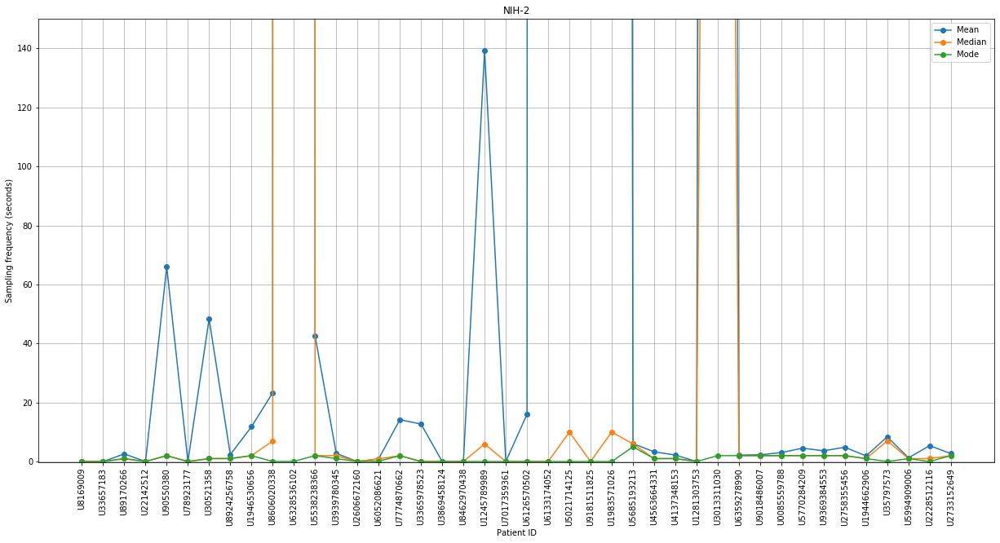

TypeError: only integer scalar arrays can be converted to a scalar index

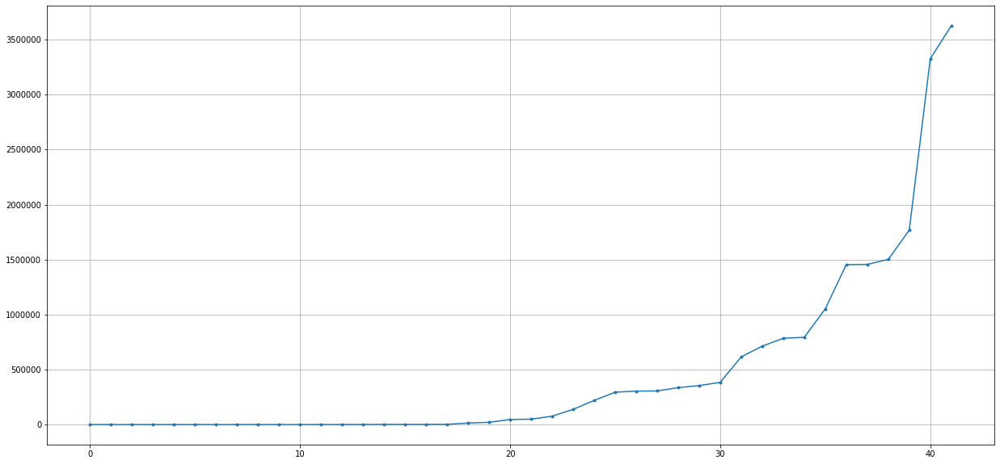

In [96]:
''' Check sampling frequency 
'''

tmp_tm = np.empty(shape=(len(dat_df['ID']),), dtype='object');

sum_stat = np.zeros(shape=(len(dat_df['ID']),3), dtype='object');

ndat = np.zeros(shape=(len(dat_df['ID']),));

for idf, gdf in enumerate(dat_df['gps_dat']):
    tmp_tm[idf] = gdf['timestamp']/1e3; # Convert timestamp to 's' from 'ms'
    
    if len(tmp_tm[idf])>0:
        ndat[idf] = len(tmp_tm[idf]);
        mn = np.mean(-np.diff(tmp_tm[idf])); md = np.median(-np.diff(tmp_tm[idf])); mo = stats.mode(-np.diff(tmp_tm[idf]))[0][0];
        sum_stat[idf,:] = np.array([mn, md, mo]);
        
        if idf>60: # Pick sub-samples of participants to see sampling frequency
            f = plt.figure(figsize=(15,5)); 
            plt.subplot(121); plt.plot(-np.diff(tmp_tm[idf][startidx:endidx]),'.-'); plt.title(f'mean: {mn:0.2f} s, median: {md:0.2f} s');
            plt.subplot(122); plt.hist(-np.diff(tmp_tm[idf][startidx:endidx]), bins=np.arange(0,20,0.5)); plt.title(dat_df['ID'][idf])
            plt.show();
            

# print(sum_stat)
# Plot summary statistics
stat_label=['Mean','Median','Mode'];
f=plt.figure(figsize=(21,10)); 
for i in range(len(sum_stat[0])):
    plt.plot(sum_stat[:,i],'o-',label=stat_label[i]); 
    
plt.legend(); plt.grid(); plt.ylim([-0.2, 150]); plt.ylabel('Sampling frequency (seconds)'); plt.xlabel('Patient ID'); plt.title('NIH-2')
plt.xticks(np.arange(len(dat_df['ID'])),dat_df['ID'],rotation='vertical'); plt.savefig('Figures/sampling_freq.png')
plt.show();


f=plt.figure(figsize=(21,10)); plt.plot(np.sort(ndat),'.-'); plt.grid();
plt.xticks(np.arange(len(dat_df['ID'])),dat_df['ID'][np.argsort(ndat)],rotation='vertical');
plt.show();

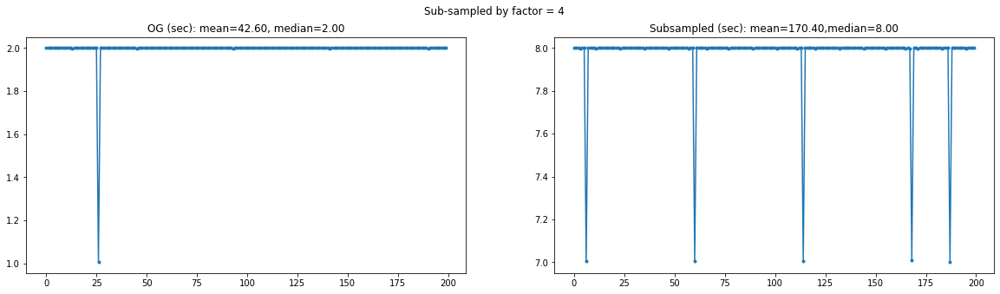

In [97]:
''' Sub-sample by a factor = sample_factor
'''
sample_factor = 4;

subdat_df = {'ID': [], 'gps_dat':[]};

startidx=0; endidx=200;

for idf, tmp_gdf in enumerate(dat_df['gps_dat']):
    
    if len(tmp_gdf)>0:
        gdf = tmp_gdf[tmp_gdf.index % sample_factor == 0]; # Sub-sample 
        subdat_df['ID'].append(dat_df['ID'][idf]); subdat_df['gps_dat'].append(gdf); # Add sub-sampled data to new dataframe dictionary

    if idf == 11: # Check for a random sub-sample of participants
        tmp_tm = -np.diff(tmp_gdf['timestamp']/1e3); tm = -np.diff(gdf['timestamp']/1e3);
        f=plt.figure(figsize=(20,5)); plt.subplot(121); plt.plot(tmp_tm[startidx:endidx],'.-'); plt.title(f'OG (sec): mean={np.mean(tmp_tm):0.2f}, median={np.median(tmp_tm):0.2f}');
        plt.subplot(122); plt.plot(tm[startidx:endidx],'.-'); plt.title(f'Subsampled (sec): mean={np.mean(tm):0.2f},median={np.median(tm):0.2f}')
        plt.suptitle(f'Sub-sampled by factor = {sample_factor:d}')
        
        

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


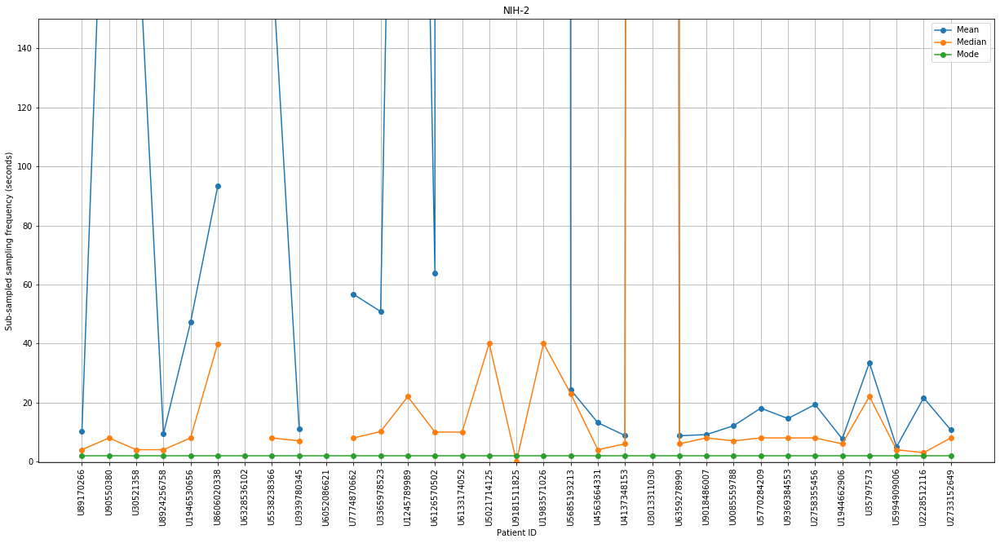

In [98]:
''' Check sampling frequency after sub-sampling
'''
tmp_tm = np.empty(shape=(len(subdat_df['ID']),), dtype='object');

sum_stat = np.zeros(shape=(len(subdat_df['ID']),3), dtype='object');

ndat = np.zeros(shape=(len(subdat_df['ID']),));

for idf, gdf in enumerate(subdat_df['gps_dat']):
    tmp_tm[idf] = gdf['timestamp']/1e3; # Convert timestamp to 's' from 'ms'
    
    if len(tmp_tm[idf])>0:
        ndat[idf] = len(tmp_tm[idf]);
        mn = np.mean(-np.diff(tmp_tm[idf])); md = np.median(-np.diff(tmp_tm[idf])); #mo = stats.mode(-np.diff(tmp_tm[idf]))[0][0];
        sum_stat[idf,:] = np.array([mn, md, mo]);
        
        if idf>60: # Pick sub-samples of participants to see sampling frequency
            f = plt.figure(figsize=(15,5)); 
            plt.subplot(121); plt.plot(-np.diff(tmp_tm[idf][startidx:endidx]),'.-'); plt.title(f'mean: {mn:0.2f} s, median: {md:0.2f} s');
            plt.subplot(122); plt.hist(-np.diff(tmp_tm[idf][startidx:endidx]), bins=np.arange(0,20,0.5)); plt.title(dat_df['ID'][idf])
            plt.show();
            

# print(sum_stat)
# Plot summary statistics
stat_label=['Mean','Median','Mode'];
f=plt.figure(figsize=(21,10)); 
for i in range(len(sum_stat[0])):
    plt.plot(sum_stat[:,i],'o-',label=stat_label[i]); 
    
plt.legend(); plt.grid(); plt.ylim([-0.2, 150]); plt.ylabel('Sub-sampled sampling frequency (seconds)'); plt.xlabel('Patient ID'); plt.title('NIH-2')
plt.xticks(np.arange(len(subdat_df['ID'])),subdat_df['ID'],rotation='vertical'); plt.savefig('Figures/sub_sampling_freq.png')
plt.show();

0it [00:00, ?it/s]/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

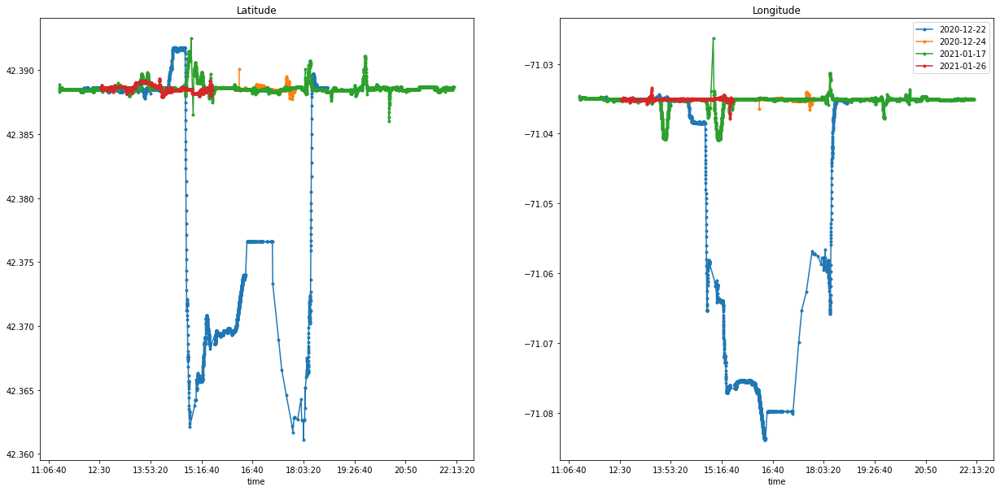

In [285]:
''' Check if lat. and long. are in the right timezone by looking at appropriate times to be home
'''
chck_subj = 1;

for idf, gdf in tqdm(enumerate(subdat_df['gps_dat'][chck_subj:chck_subj+1])):

    df3 = get_home_state(gdf); # Get % of home time 

    # Since timestamps are not always uniform, get diff from previous time point to assess home-time and outside time etc
    del_t = np.concatenate((np.array([0.0]),np.diff(df3['timestamp']))); 
    df3['del-t'] = del_t;

    
    try:
        days = df3['Date-Time'].dt.date; 
        days = np.unique(days); # choose specific dates to look at for debugging
        ndays = len(days);
    
        f=plt.figure(figsize=(21,10));
        for iday, gday in enumerate(days):

            if idf == 0:
                tm = df3['Date-Time'][df3['Date-Time'].dt.date == gday].dt.time;
                lon = df3['rounded_lon'][df3['Date-Time'].dt.date == gday];
                lat = df3['rounded_lat'][df3['Date-Time'].dt.date == gday];
                hs = (df3['home_state'][df3['Date-Time'].dt.date == gday]=='home').astype(int); #pdb.set_trace();

                plt.subplot(121); plt.plot(tm,lat,'.-',label=gday); #plt.plot(tm,hs*42.1758,'--',color='green'); plt.ylim([42.1, 42.2]);
                plt.title('Latitude'); 

                plt.subplot(122); plt.plot(tm,lon,'.-',label=gday); #plt.plot(tm,hs*(-71),'--',color='green'); plt.ylim([-71.9, -71.78]);
                plt.title('Longitude'); plt.legend();

        if idf == chck_subj:
            ID = subdat_df['ID'][idf];
            f=plt.figure(figsize=(21,10));
            plt.plot(days,home_tm[idf],'-o'); plt.xticks(days,days,rotation='vertical'); plt.ylabel('Fraction of home time');
            plt.grid(); plt.xlabel('Date'); plt.title(f'{idf:d}: {ID}'); plt.show();

    except AttributeError:
        print(f'{idf:d} has Attribute Error');
        home_tm[idf], ndat[idf], freq_day[idf], unique_days[idf] = [np.zeros(shape=(0,)) for _ in range(4)]

In [287]:
''' Calculate home-time: 
'''
nsubj_passive = len(subdat_df['ID']); print(f'No. of students with passive data: {nsubj_passive:d}');
home_tm, ndat, freq_day, unique_days = [np.empty(shape=(nsubj_passive,),dtype='object') for _ in range(4)];
chck_subj = 100;

for idf, gdf in tqdm(enumerate(subdat_df['gps_dat'])): #[chck_subj:chck_subj+1]):

    df3 = get_home_state(gdf); # Get % of home time 

    # Since timestamps are not always uniform, get diff from previous time point to assess home-time and outside time etc
    del_t = np.concatenate((np.array([0.0]),np.diff(df3['timestamp']))); 
    df3['del-t'] = del_t;

    
    try:
        days = df3['Date-Time'].dt.date; 
        days = np.unique(days); # choose specific dates to look at for debugging
        ndays = len(days);
        unique_days[idf] = days;
        home_tm[idf], ndat[idf], freq_day[idf] = [np.zeros(shape=(ndays,)) for _ in range(3)];

        #f=plt.figure(figsize=(21,10));
        for iday, gday in enumerate(days):

            idx_home = df3['home_state'][df3['Date-Time'].dt.date == gday] == 'home';
            del_t = df3['del-t'][df3['Date-Time'].dt.date == gday];

            home_tm[idf][iday] = np.sum(del_t[idx_home])/np.sum(del_t); # Fraction of time at home
            ndat[idf][iday] = len(del_t); # Number of data points for that day
            freq_day[idf][iday] = -np.median(del_t)/1e3;

            if idf == chck_subj:
                tm = df3['Date-Time'][df3['Date-Time'].dt.date == gday].dt.time;
                lon = df3['rounded_lon'][df3['Date-Time'].dt.date == gday];
                lat = df3['rounded_lat'][df3['Date-Time'].dt.date == gday];
                hs = (df3['home_state'][df3['Date-Time'].dt.date == gday]=='home').astype(int); #pdb.set_trace();

                plt.subplot(121); plt.plot(tm,lat,'.-',label=gday); plt.plot(tm,hs*42.1758,'--',color='green'); plt.ylim([42.1, 42.2]);
                plt.title('Latitude'); 

                plt.subplot(122); plt.plot(tm,lon,'.-',label=gday); plt.plot(tm,hs*(-71),'--',color='green'); plt.ylim([-71.9, -71.78]);
                plt.title('Longitude'); plt.legend();

        if idf == chck_subj:
            ID = subdat_df['ID'][idf];
            f=plt.figure(figsize=(21,10));
            plt.plot(days,home_tm[idf],'-o'); plt.xticks(days,days,rotation='vertical'); plt.ylabel('Fraction of home time');
            plt.grid(); plt.xlabel('Date'); plt.title(f'{idf:d}: {ID}'); plt.show();

    except AttributeError:
        print(f'{idf:d} has Attribute Error');
        home_tm[idf], ndat[idf], freq_day[idf], unique_days[idf] = [np.zeros(shape=(0,)) for _ in range(4)]

0it [00:00, ?it/s]

No. of students with passive data: 33


/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.p

17 has Attribute Error


33it [06:53,  6.62s/it]


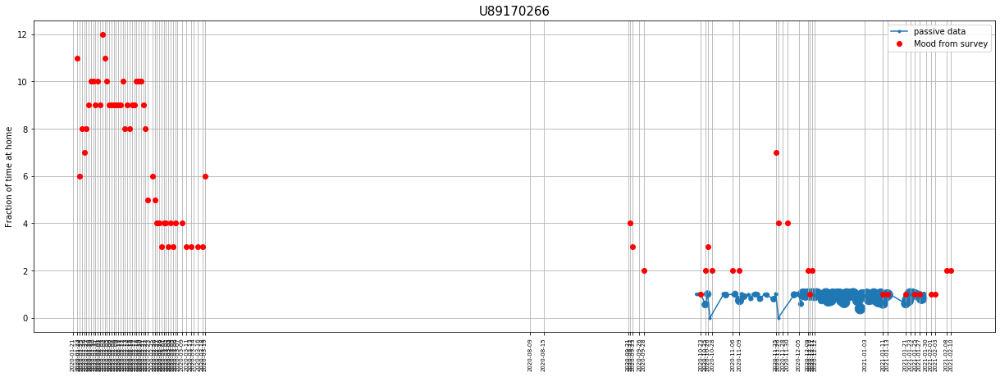

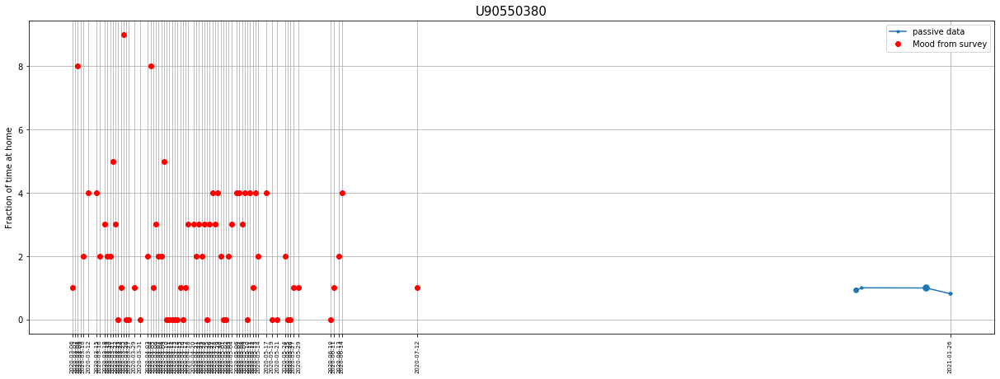

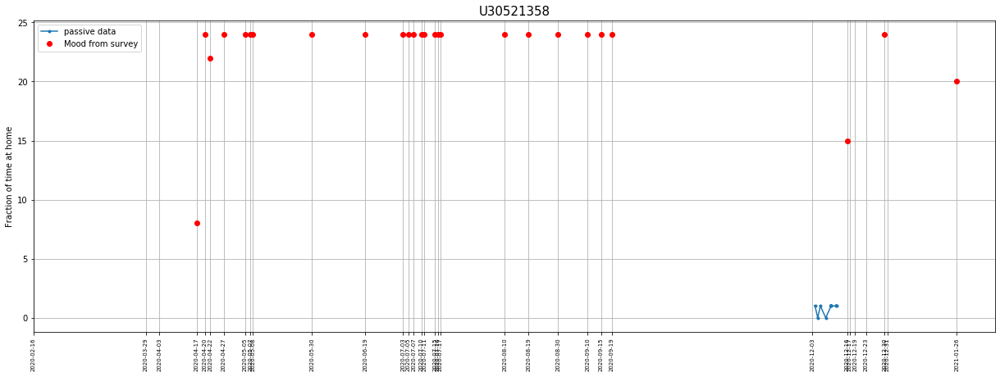

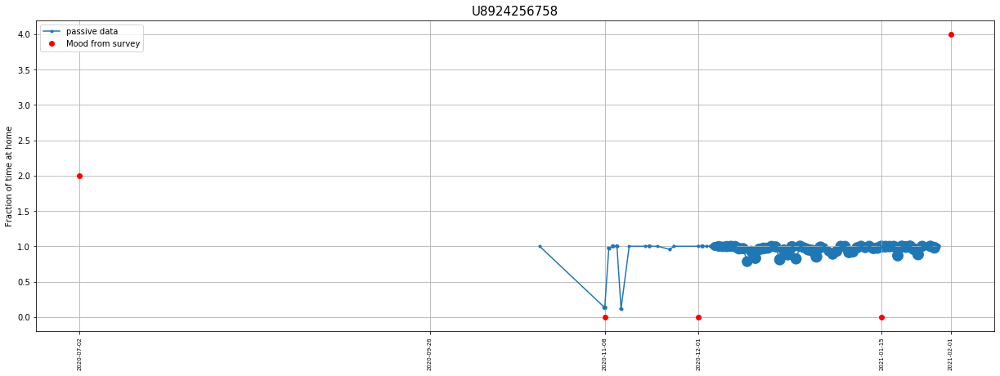

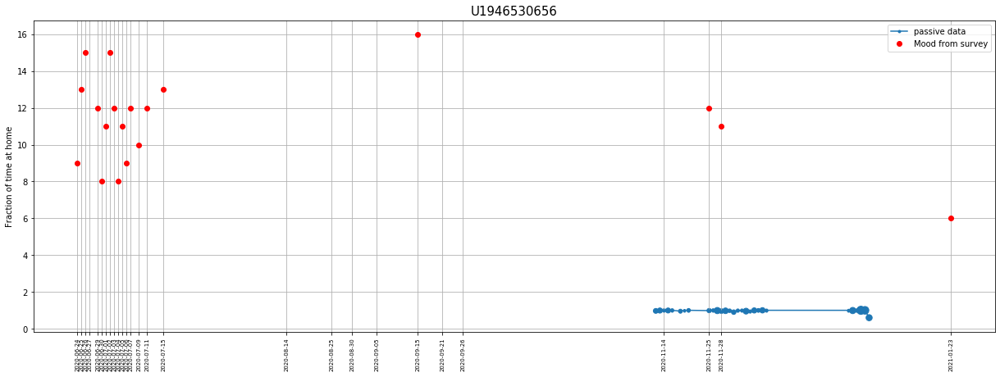

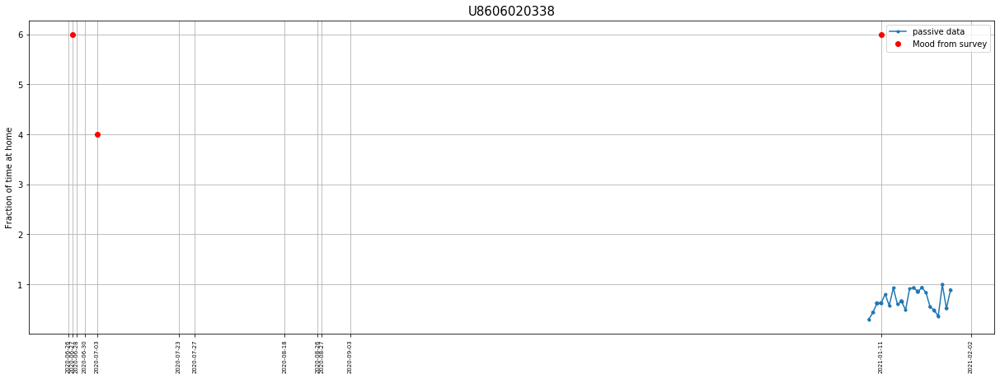

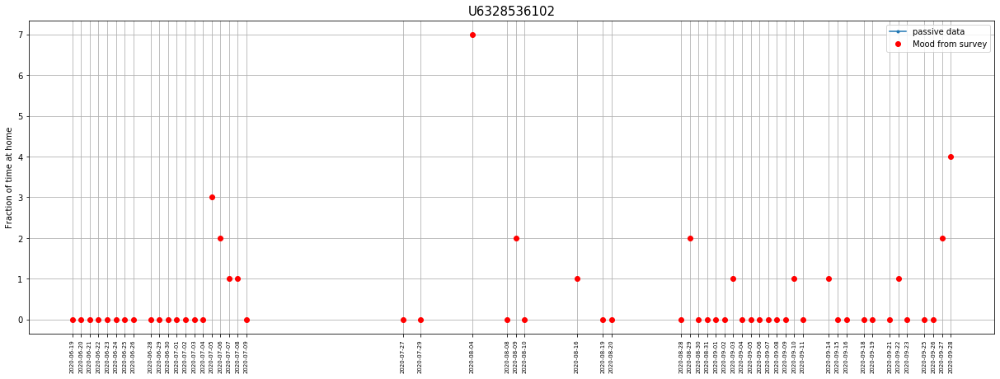

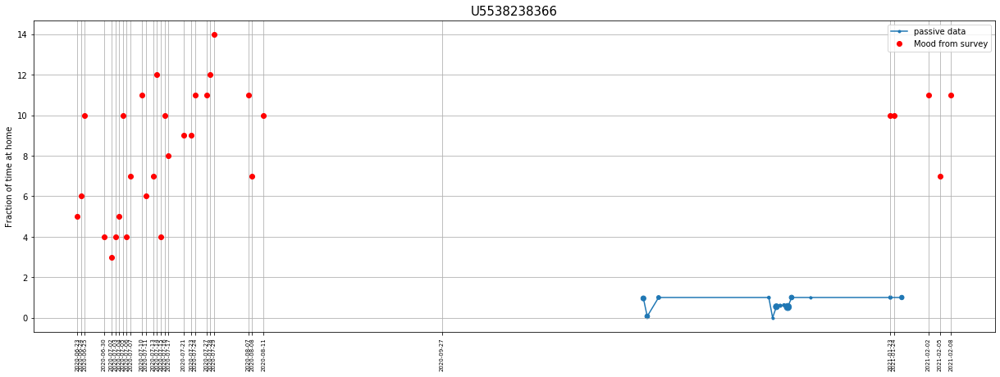

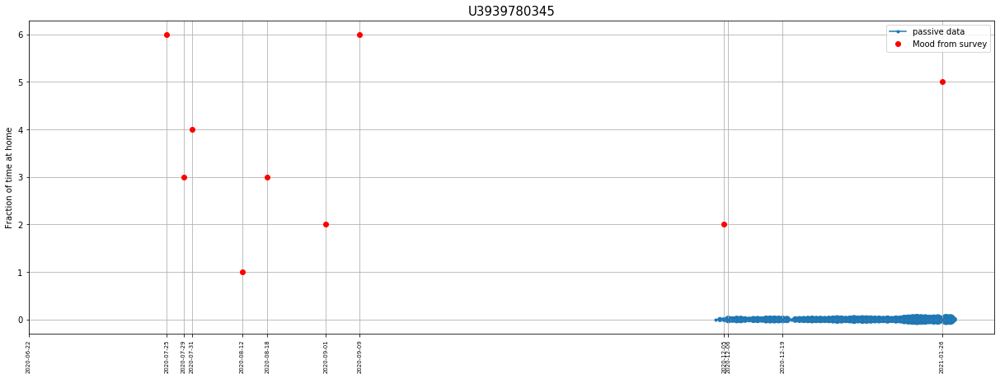

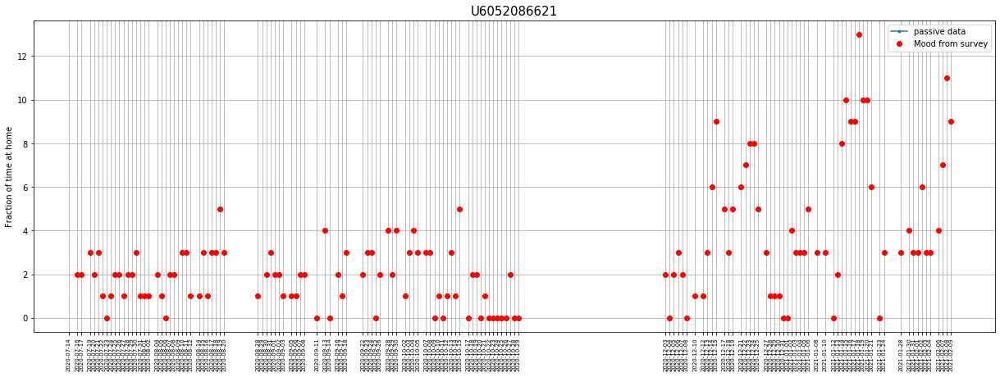

In [288]:
''' Plot home-time for each participant, marker size = number of data points
'''
chk = 0;
for idf, gdf in enumerate(subdat_df['gps_dat'][0:10]):
    
    f=plt.figure(figsize=(21,7)); plt.plot(unique_days[idf], home_tm[idf],'.-',label='passive data'); 
    plt.scatter(unique_days[idf], home_tm[idf],s=ndat[idf]/100)
    plt.ylabel('Fraction of time at home'); plt.grid(); plt.yticks(fontsize=10)
    plt.xticks(unique_days[idf], unique_days[idf], rotation = 'vertical',fontsize=7); 
    plt.title(subdat_df['ID'][idf], fontsize=15);

    #Survey score
    test_sur = survey_ID_score['survey'][survey_ID_score['ID'].index(subdat_df['ID'][idf])]; #print(test_sur)
    unique_days_sur = test_sur['Date']; mood = test_sur['Mood'];
    plt.plot(unique_days_sur,mood,'o',color='red',label='Mood from survey'); 
    plt.xticks(unique_days_sur, unique_days_sur, rotation = 'vertical',fontsize=7); 
    plt.legend();
    
    if idf == 0 or idf == 10:
        plt.savefig(f'Figures/pass_act_{idf:d}.png');

    plt.show();

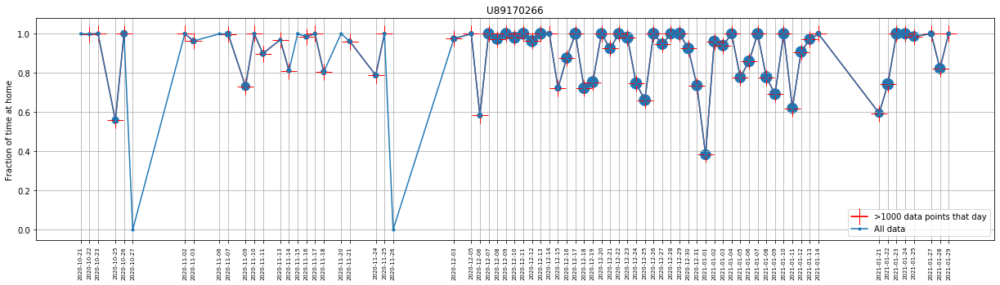

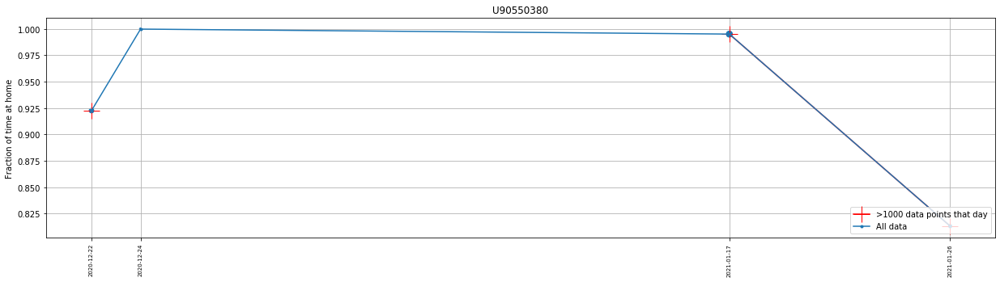

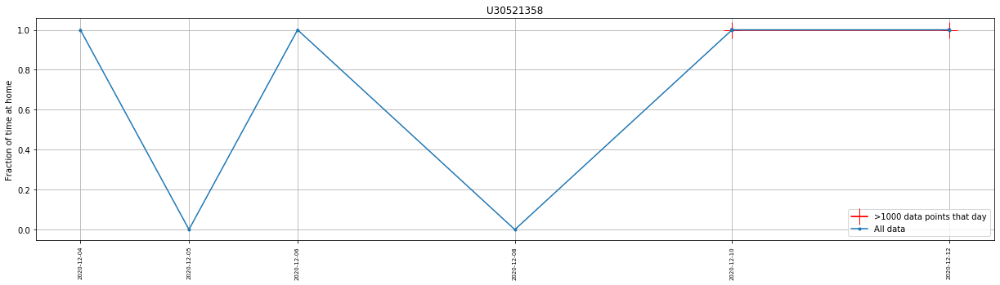

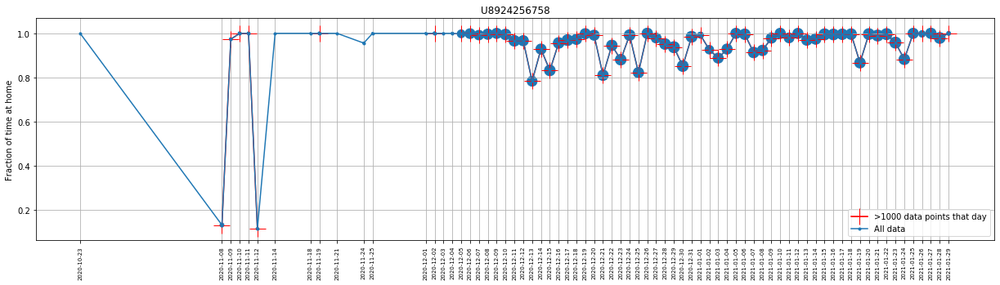

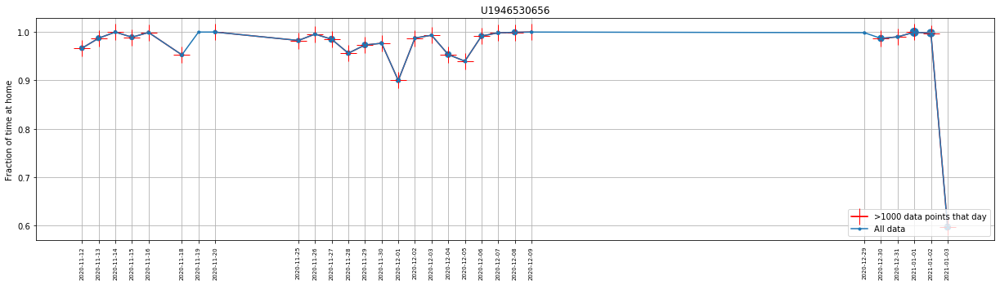

...

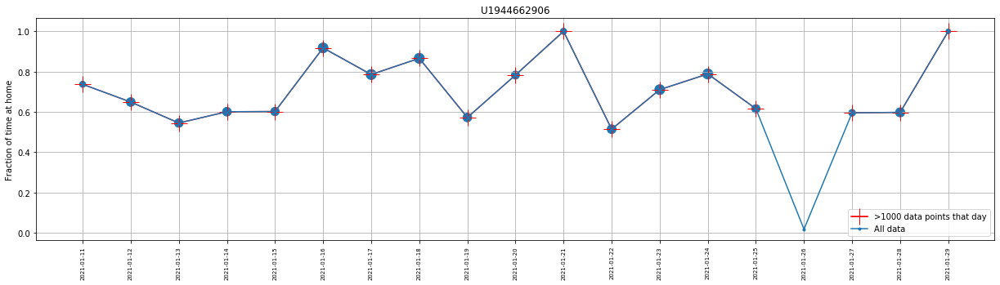

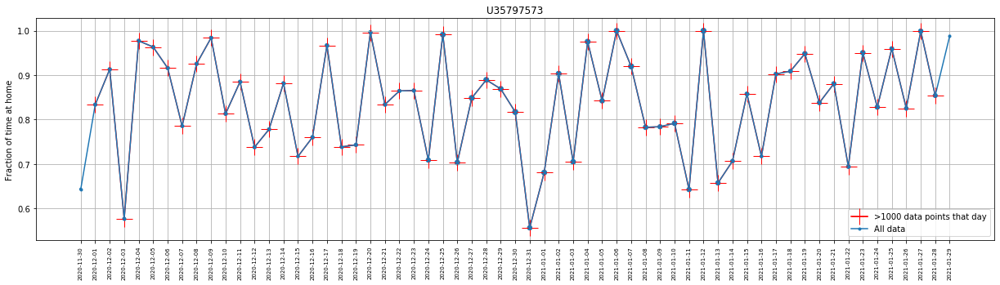

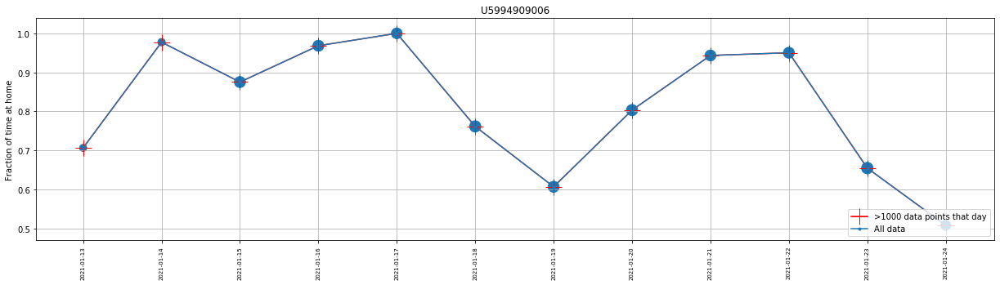

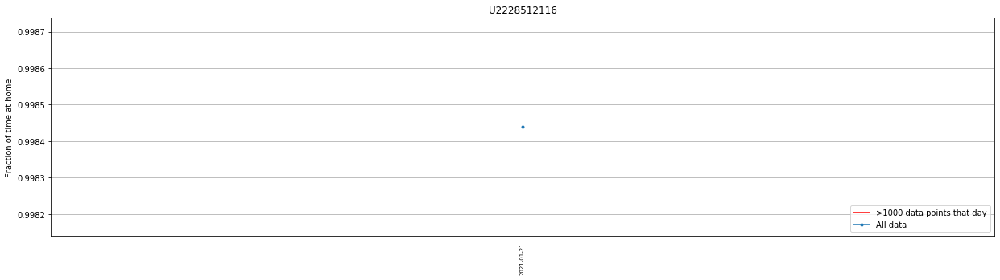

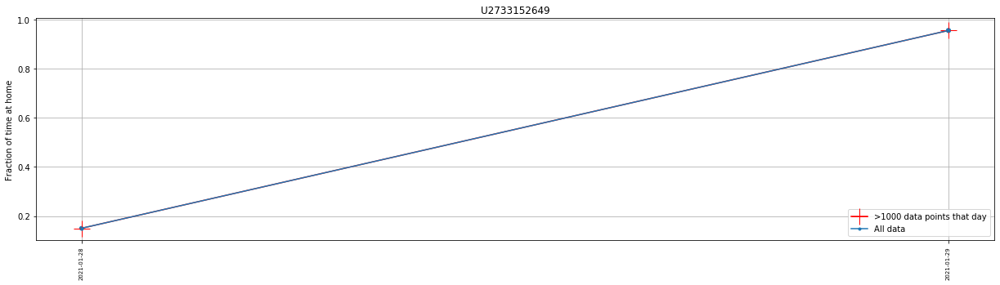

In [293]:
''' Remove days with too few samples
Looks like some days, the frequency (of sub-sampled data) is 4 s, while it is variable on other days. 
Choose days with ~8s sampling freq => days with less than 86,400/8 == 10,000 points
'''

nday_thresh = 1000; # min. number of points needed in a day to be included in the analysis

home_tm_thresh = home_tm.copy();

for idf, nday_subj in enumerate(ndat):
    home_tm_thresh[idf] = home_tm[idf].copy(); #pdb.set_trace();
    
    low_dat_days = np.where(nday_subj < nday_thresh)[0]; #print(f'{isubj}: {low_dat_days}')
    home_tm_thresh[idf][low_dat_days] = float('nan');
    
    f=plt.figure(figsize=(21,5)); plt.plot(unique_days[idf],home_tm_thresh[idf],'+-',color='red',ms=20,label=f'>{nday_thresh:d} data points that day');
    plt.plot(unique_days[idf], home_tm[idf],'.-',label='All data'); 
    plt.scatter(unique_days[idf], home_tm[idf],s=ndat[idf]/100)
    plt.ylabel('Fraction of time at home'); plt.grid(); plt.yticks(fontsize=10)
    plt.xticks(unique_days[idf], unique_days[idf], rotation = 'vertical',fontsize=7); 
    plt.title(subdat_df['ID'][idf]); plt.legend(loc='lower right');
    
    if idf == 0 or idf == 10:
        plt.savefig(f'Figures/home_time_thresh_{idf:d}.png');
        
    plt.show();

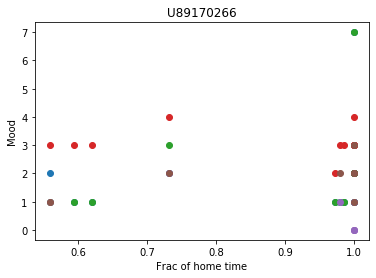

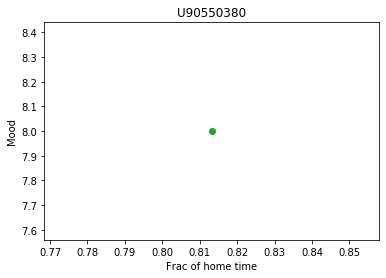

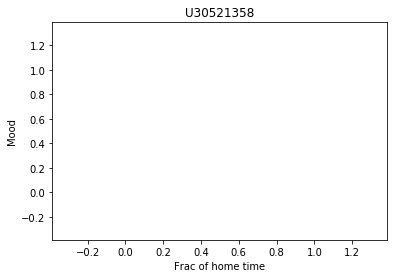

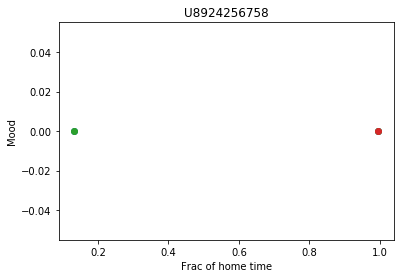

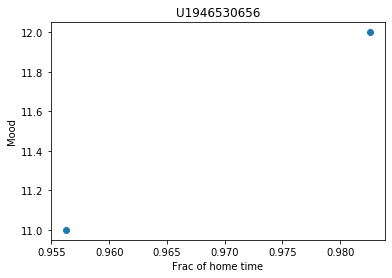

...

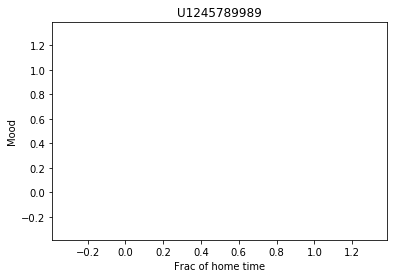

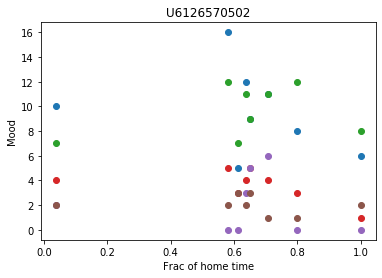

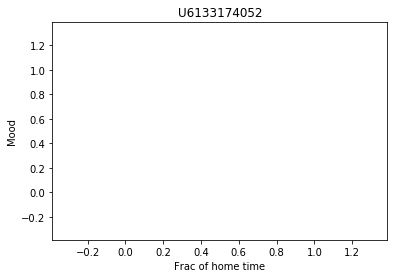

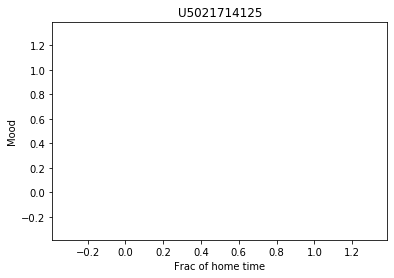

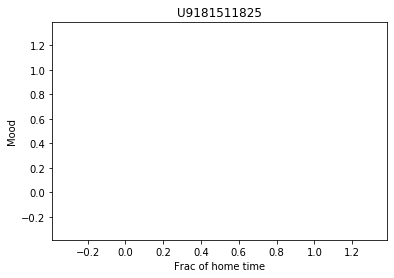

Participant 17 has no date data


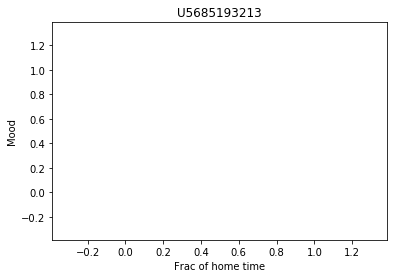

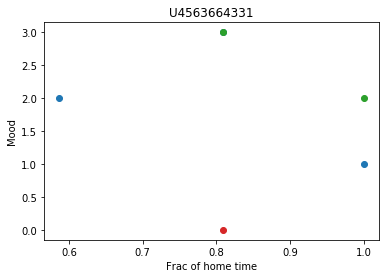

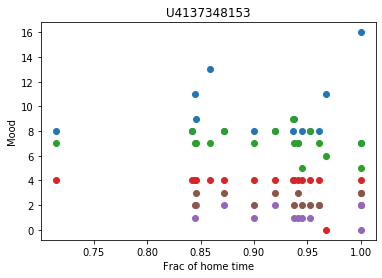

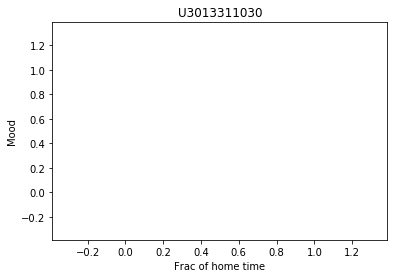

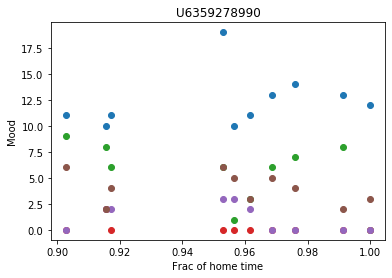

...

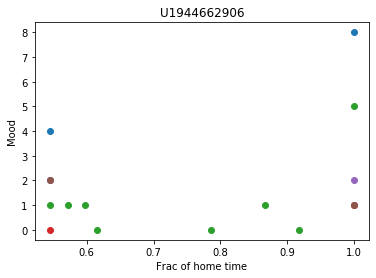

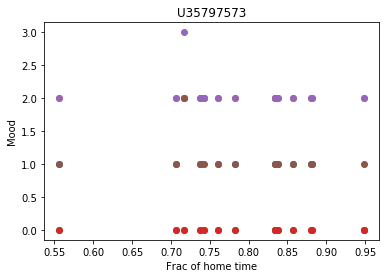

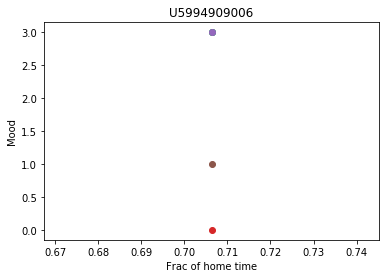

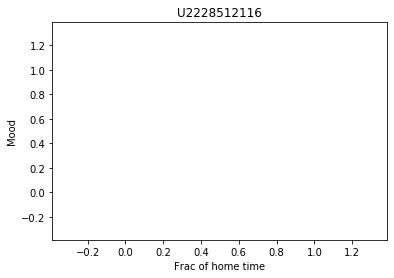

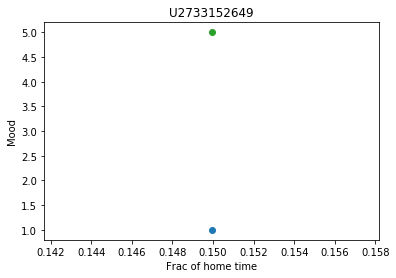

In [301]:
''' Use dataframe of survey (survey_ID_score) to correlate score and (thresholded) home-times
'''
home_tm_all, mood_all, anx_all, score_all = [[] for _ in range(4)]

for idf, gdf in enumerate(subdat_df['gps_dat']):
    test_sur = survey_ID_score['survey'][survey_ID_score['ID'].index(subdat_df['ID'][idf])]; #print(test_sur)
    
    try:
        days=np.unique(gdf['Date-Time'].dt.date); 
        home_tm_dict ={'Date':days, 'Home time': home_tm_thresh[idf]}

        home_tm_df = pd.DataFrame(home_tm_dict); #print(home_tm_df)

        mood, anx = [np.zeros(shape=(len(home_tm_df))) for _ in range(2)];
        score_passive = np.zeros(shape=(len(home_tm_df),len(score_list)));
        
        for i_date,j_date in enumerate(home_tm_df['Date']):
            date_idx = test_sur['Date'] == j_date; dd = test_sur['Date'][date_idx]; #print(f'{j_date}, {dd}');
            if len(dd) ==0:
                mood[i_date] = float('nan');
                score_passive[i_date,:] = [float('nan') for _ in range(len(score_list))]
            else:
                mood[i_date] = test_sur[date_idx]['Mood']; anx[i_date] = test_sur[date_idx]['Anxiety'];
                score_passive[i_date,:] = test_sur[date_idx][score_list]; 
                

        home_tm_all.append(home_tm_thresh[idf].tolist()); mood_all.append(mood.tolist()); anx_all.append(anx.tolist());
        score_all.append(score_passive.tolist()); 
        
        f = plt.figure();
        for iscore in range(len(score_list)):
            plt.plot(home_tm_thresh[idf],score_passive[:,iscore],'o'); 
            plt.xlabel('Frac of home time'); plt.ylabel('Mood'); plt.title(subdat_df['ID'][idf]);
        plt.show();

#         f = plt.figure(); plt.plot(mood, anx,'o'); plt.xlabel('Mood'); plt.ylabel('Anxiety'); 
#         plt.title(subdat_df['ID'][idf]); plt.show();
    
    except AttributeError:
        print(f'Participant {idf:d} has no date data');

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:3399: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


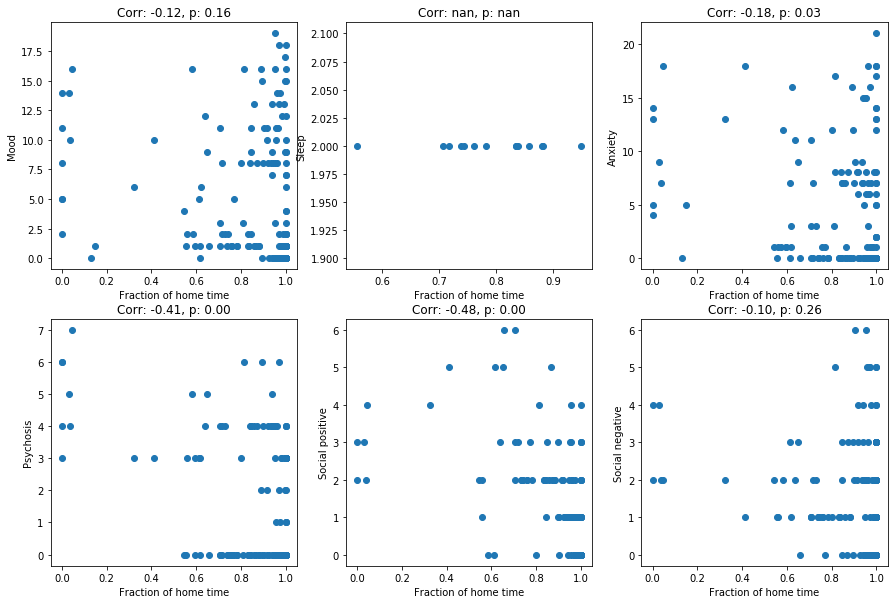

In [308]:
# Unpack the appended lists
mood_all2 = np.array(list(itertools.chain(*mood_all))); 
home_all2 = np.array(list(itertools.chain(*home_tm_all))); 
anx_all2 = np.array(list(itertools.chain(*anx_all))); 
score_all2 = np.array(list(itertools.chain(*score_all))); 

# Check correlation
r_hm, p_hm = corr_with_nan(home_all2, mood_all2);
r_ha, p_ha = corr_with_nan(home_all2, anx_all2);
r_ma, p_ma = corr_with_nan(anx_all2, mood_all2);

f=plt.figure(figsize=(15,10));

r_h, p_h = [np.empty(shape=(len(score_list),)) for _ in range(2)] 
for iscore in range(len(score_list)):
    plt.subplot(2,3,iscore+1); plt.plot(home_all2,score_all2[:,iscore],'o'); plt.ylabel(score_list[iscore]); plt.xlabel('Fraction of home time');
    r_h[iscore], p_h[iscore] = corr_with_nan(home_all2, score_all2[:,iscore]);
    
    plt.title(f'Corr: {r_h[iscore]:0.2f}, p: {p_h[iscore]:0.2f}')


plt.savefig('Figures/Home_score_scatter.png'); plt.show();

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  """


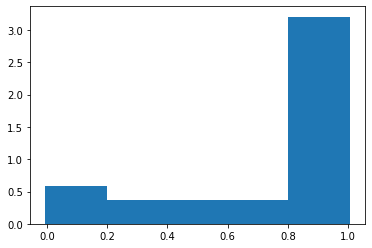

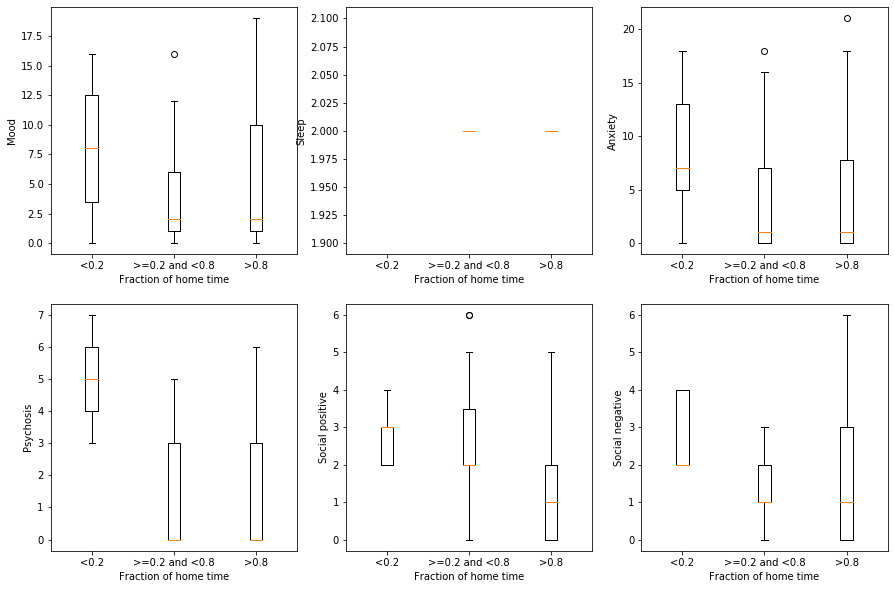

In [311]:
idx_hm = np.ma.masked_invalid(home_all2); msk = ~idx_hm.mask; home_msk = home_all2[msk]; #print(len(home_msk))
score_msk = score_all2[msk,:];
from scipy.stats import binned_statistic
bins = np.array([-0.005, 0.2, 0.8, 1.005])
bin_dat = plt.hist(home_msk, bins=bins,normed=True); #print(bin_dat)
_, _, idxbin = binned_statistic(home_msk, home_msk, bins=bins); #print(idxbin)

nbin = np.unique(idxbin); score_bin = np.empty(shape=(len(nbin),len(score_list)),dtype='object');

f=plt.figure(figsize=(15,10));
for iscore in range(len(score_list)):
    plt.subplot(2,3,iscore+1);
    
    for ibin, jbin in enumerate(nbin):
        score_bin[ibin,iscore] = score_msk[np.where(idxbin == jbin)[0],iscore]; 
        plt.boxplot(score_bin[ibin,iscore][~np.isnan(score_bin[ibin,iscore])],
                    positions = np.arange(ibin,ibin+1)); 
        plt.xticks(np.arange(len(nbin)),['<0.2','>=0.2 and <0.8','>0.8']); plt.xlabel('Fraction of home time'); plt.ylabel(score_list[iscore]);

plt.savefig(f'Figures/Home_score_box.png')



/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.


[0.13157857 0.11471429]


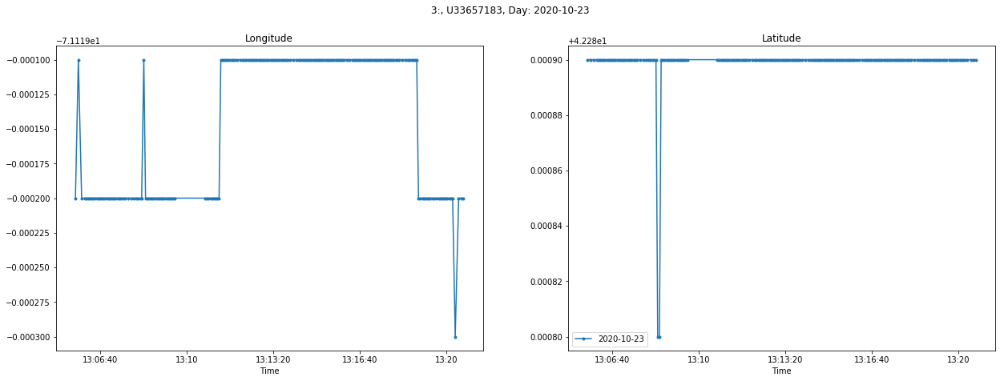

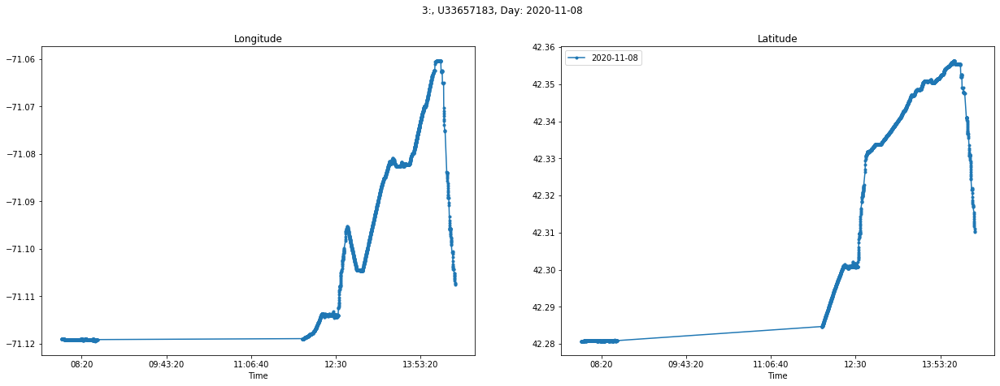

[0.06849405]


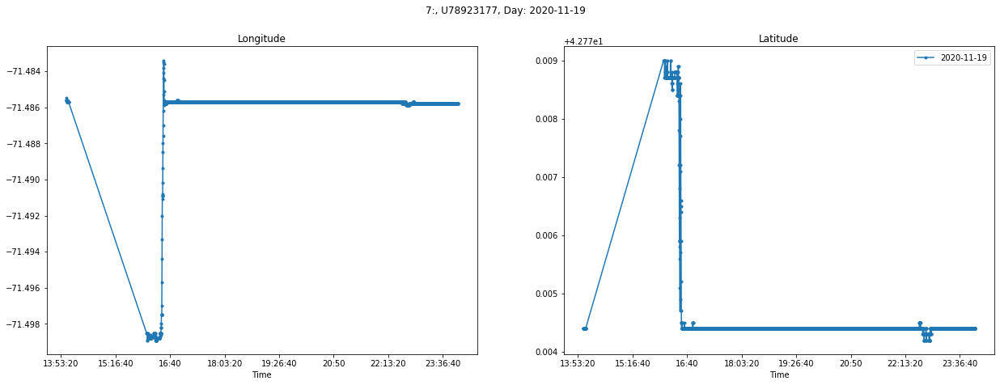

[-0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00  6.95948969e-05 -0.00000000e+00
  5.79419975e-05 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00]


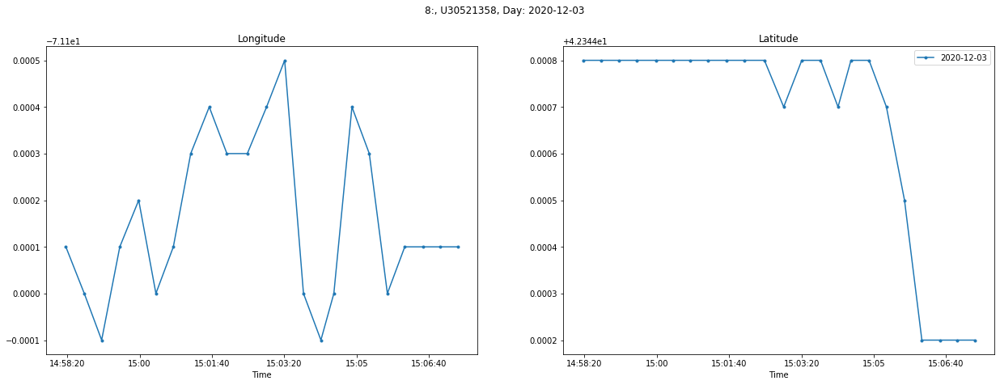

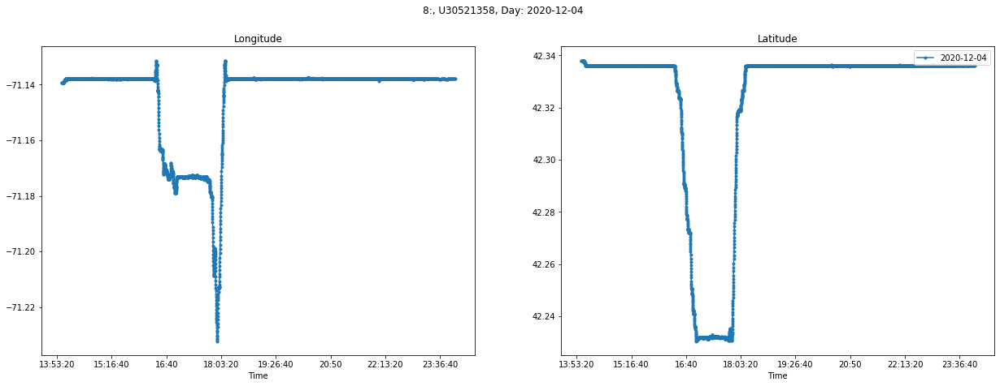

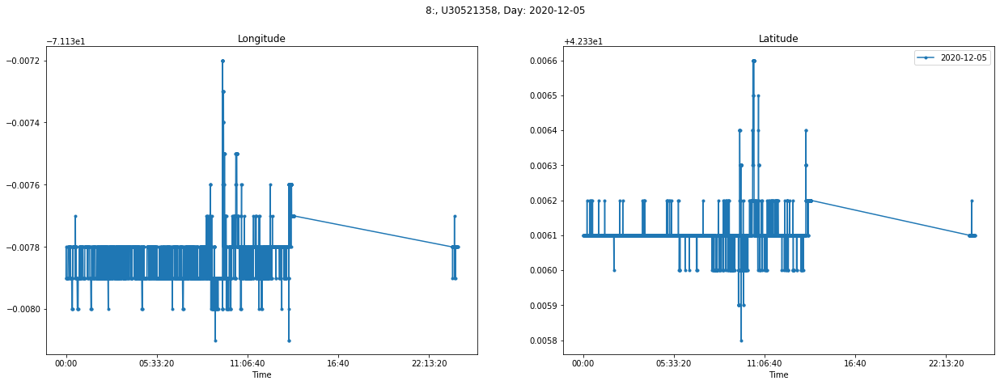

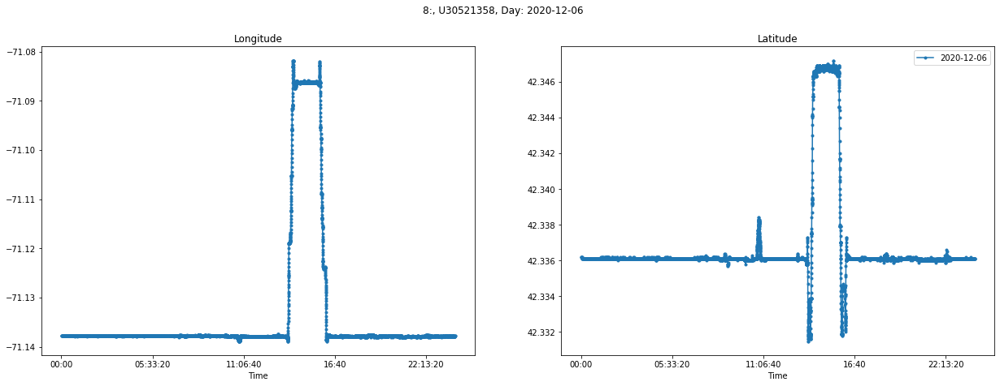

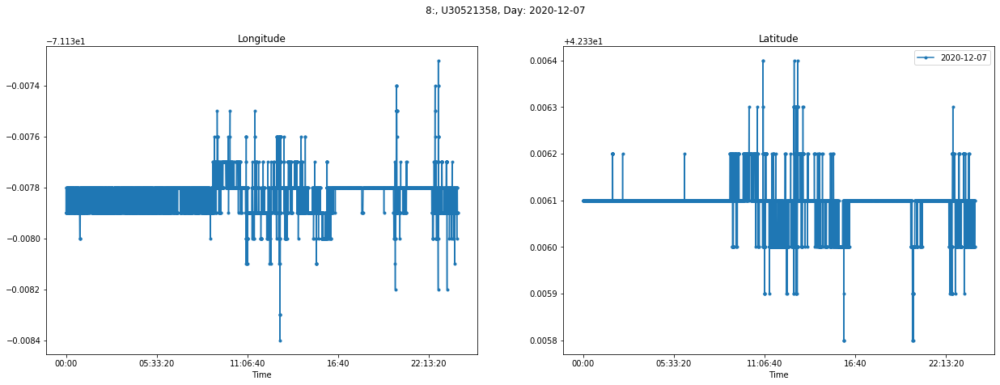

...

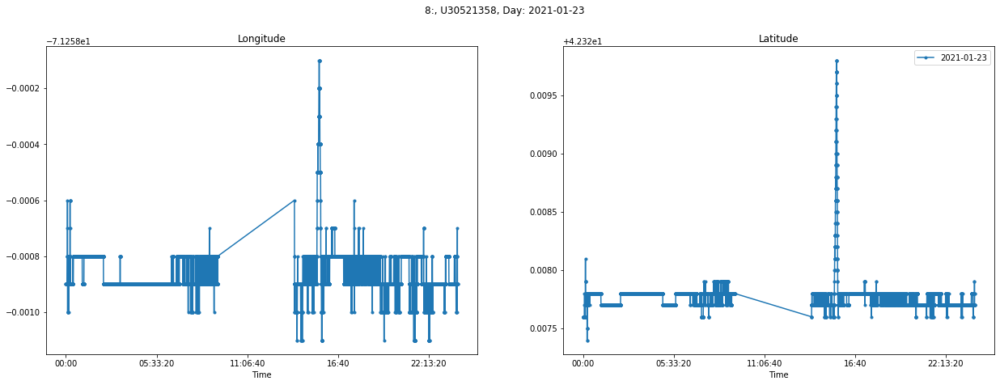

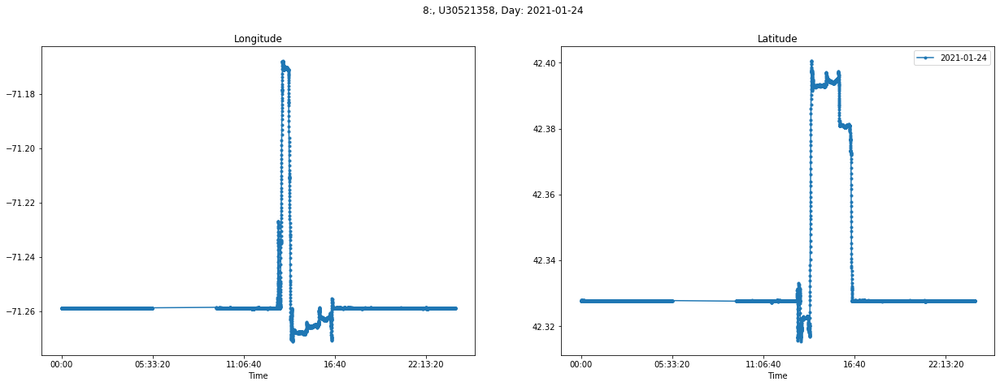

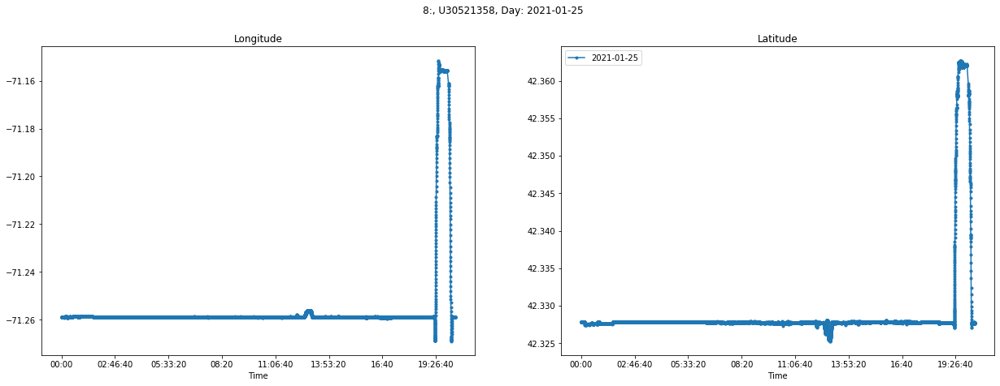

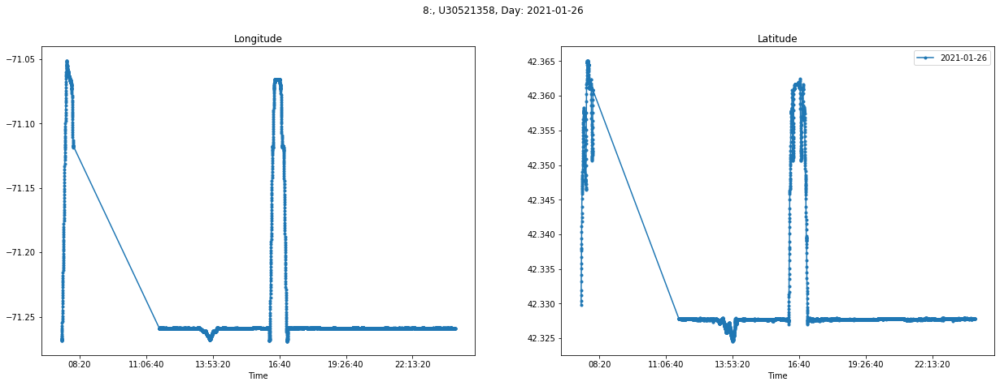

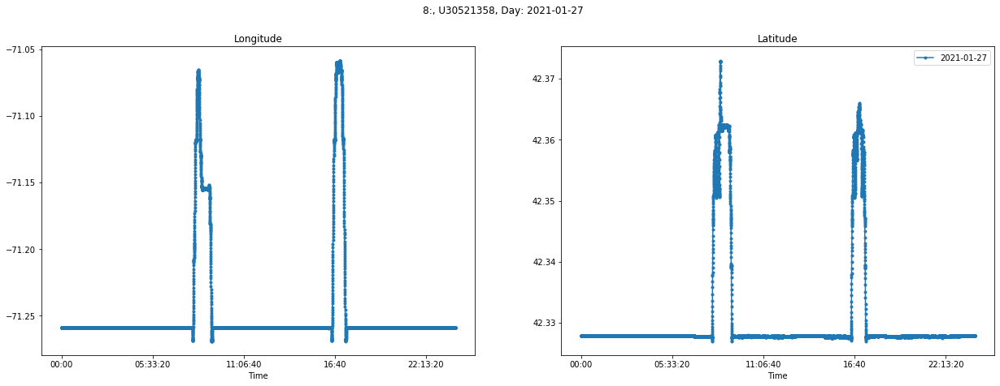

[ 0.00859809 -0.        ]


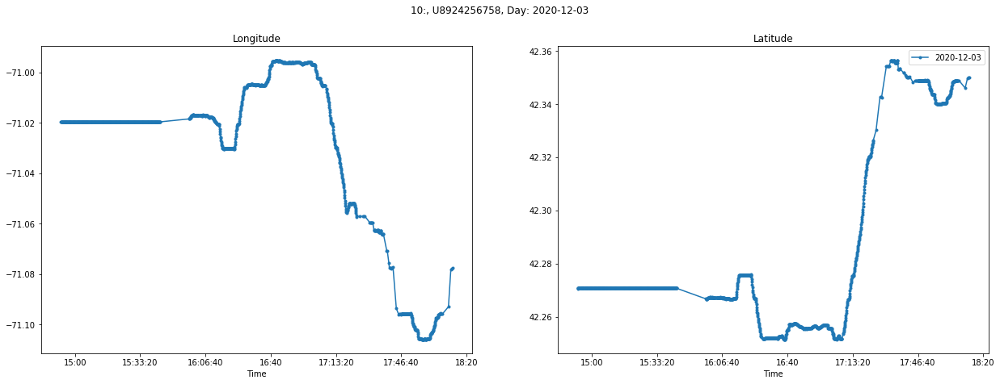

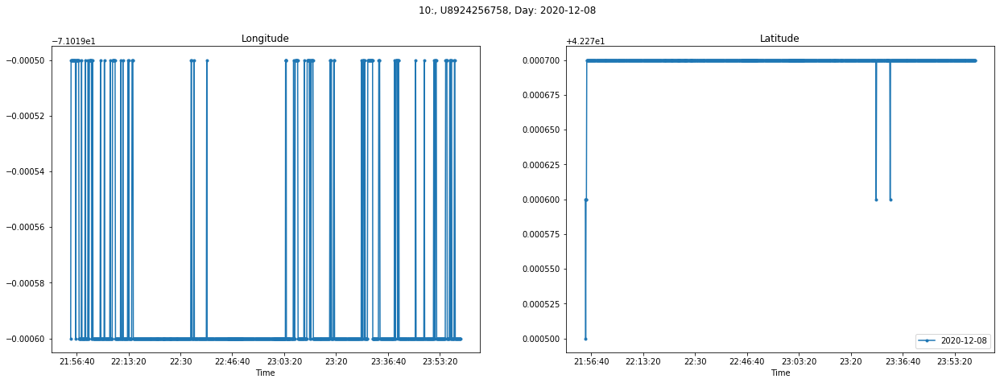

[ 0.04525394  0.03059694  0.01752029  0.0011146  -0.          0.00037227
  0.00107637]


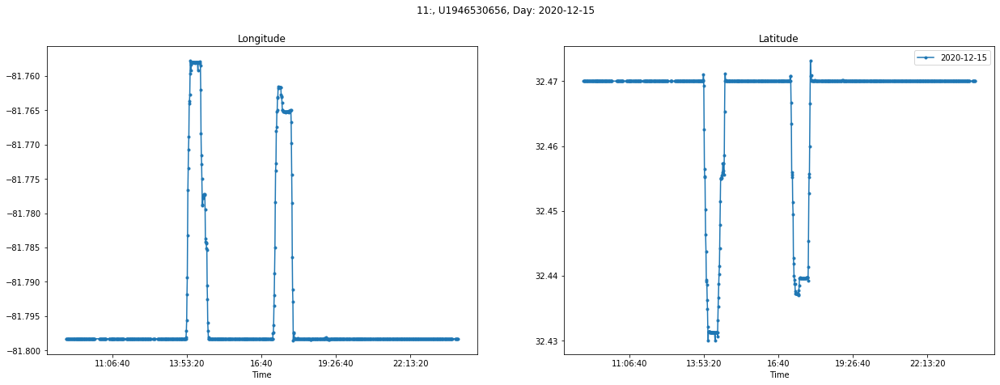

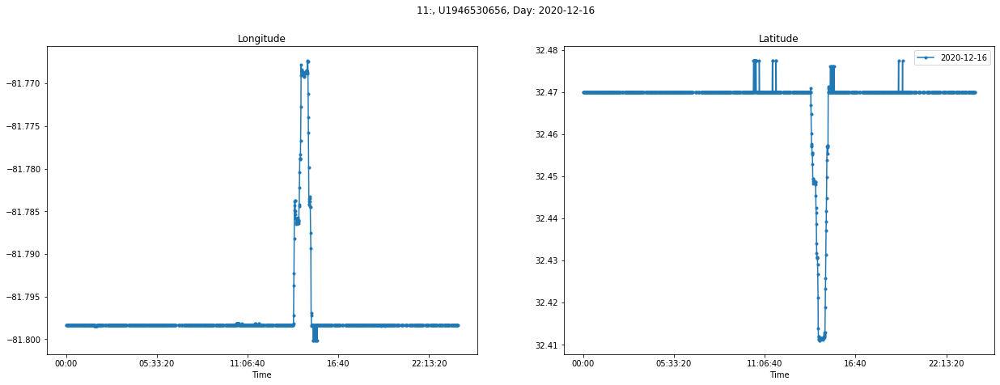

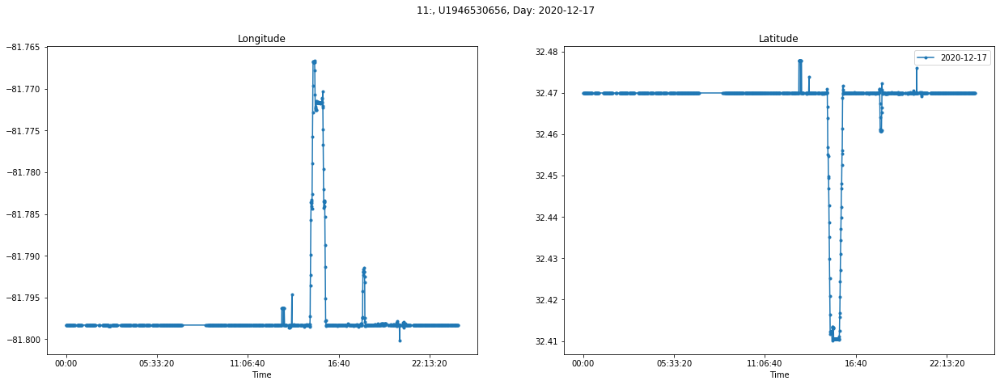

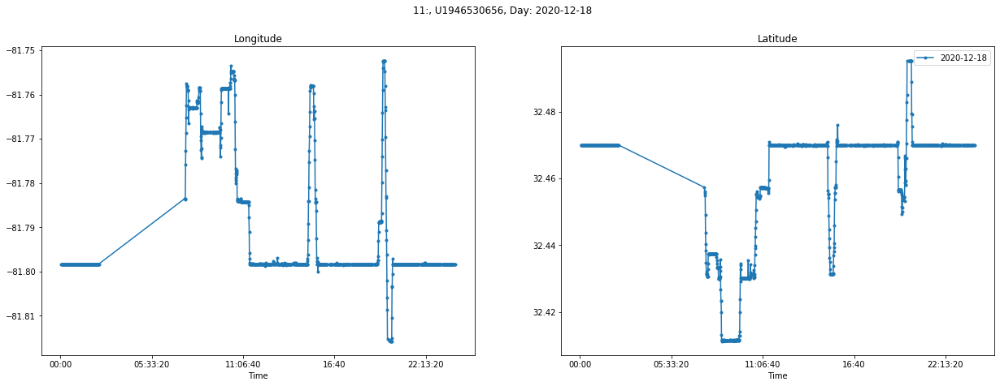

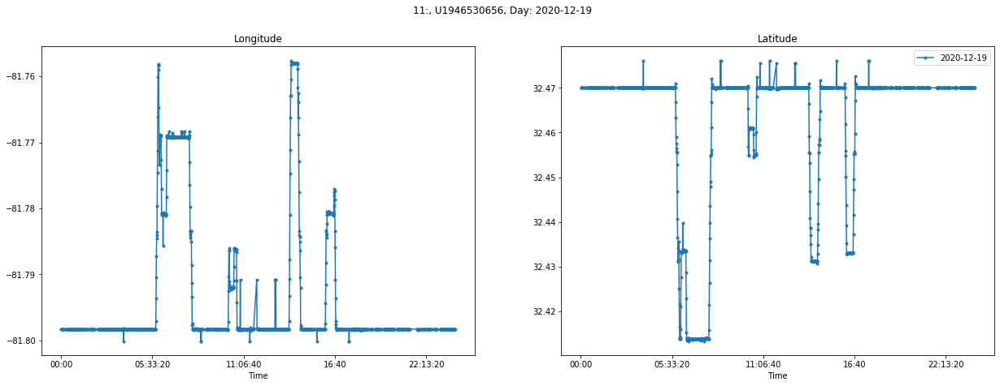

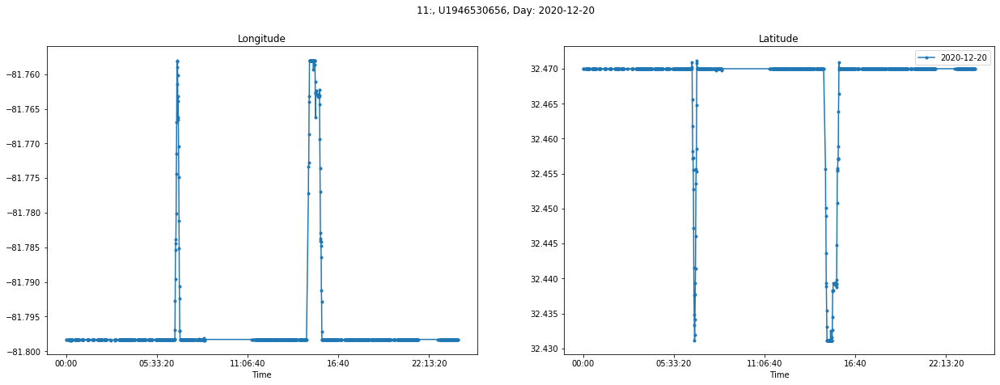

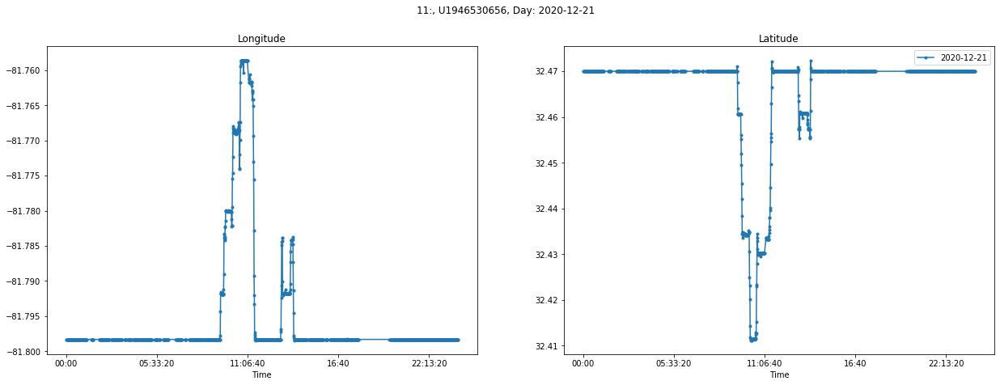

[0.03894871]


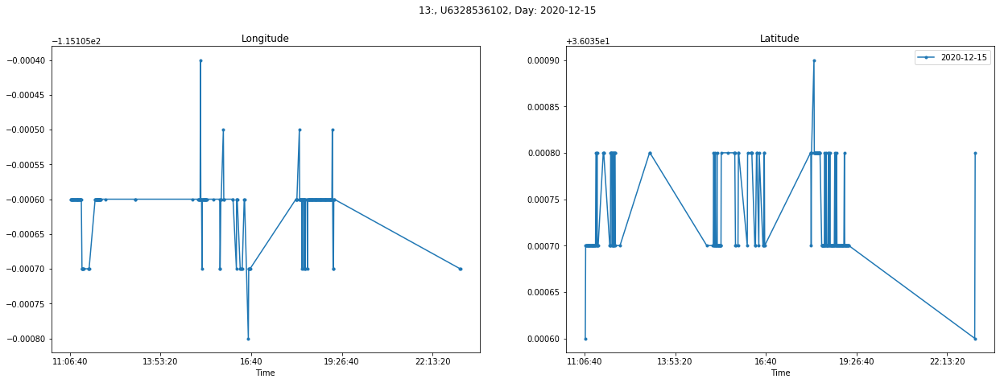

[0.06499589]


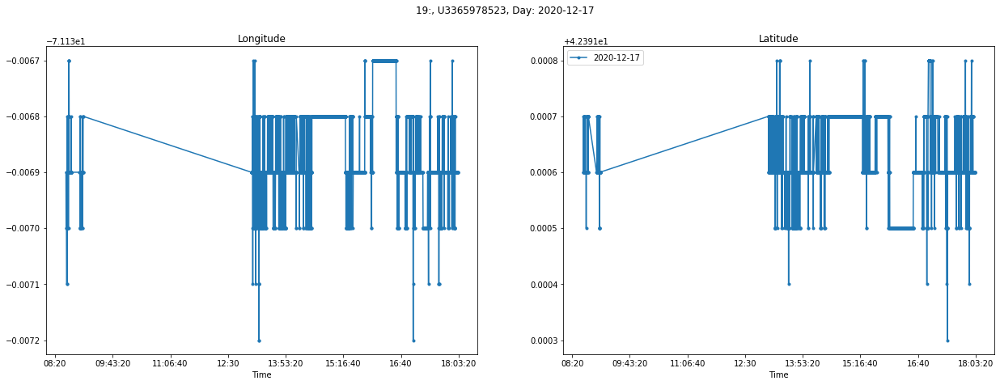

[8.13893827e-05]


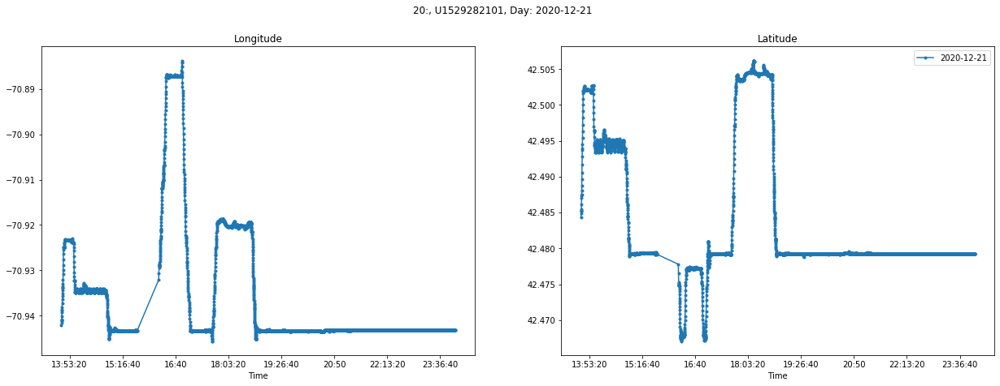

[0.19835077]


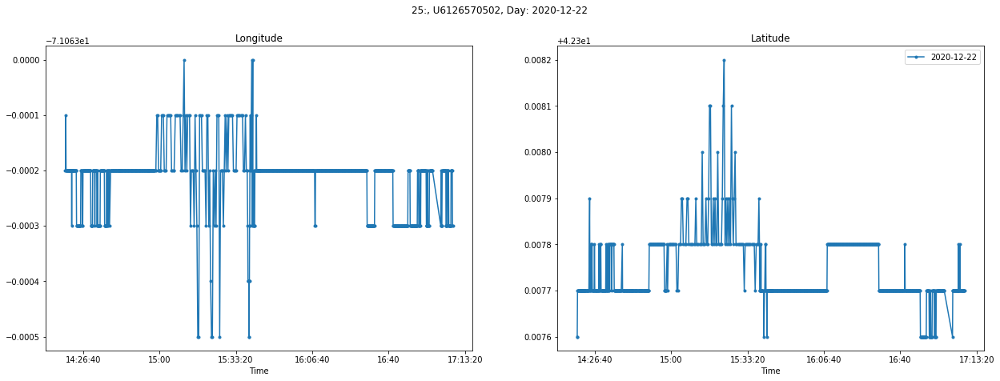

[0.14993035]


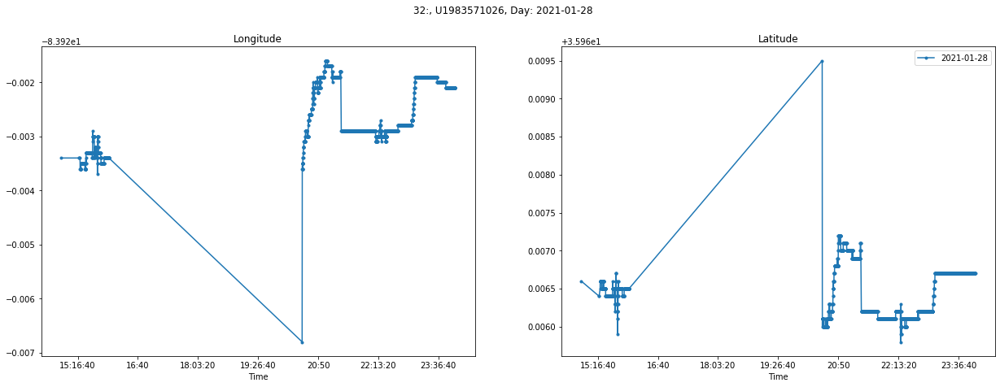

In [417]:
''' How reliable are the estimates of home-time < 0.2?
'''
for idf in range(len(home_tm_thresh)):
    low_hmtm = np.where(home_tm_thresh[idf]<0.2)[0];
    if len(low_hmtm)>0:
        print(home_tm_thresh[idf][low_hmtm]);
        
        for iday in range(len(low_hmtm)):
            gday =unique_days[idf][iday];
            f=plt.figure(figsize=(21,7)); 
            df3 = subdat_df['gps_dat'][idf];
            tm = df3['Date-Time'][df3['Date-Time'].dt.date == gday].dt.time;
            lon = df3['rounded_lon'][df3['Date-Time'].dt.date == gday];
            lat = df3['rounded_lat'][df3['Date-Time'].dt.date == gday];
            plt.subplot(1,2,1); plt.plot(tm,lon,'.-',label=gday); plt.title('Longitude'); plt.xlabel('Time');
            plt.subplot(1,2,2); plt.plot(tm,lat,'.-',label=gday); plt.title('Latitude'); plt.xlabel('Time');
            plt.legend(); plt.suptitle(f'{idf:d}:, {ID[idf]}, Day: {gday}'); plt.show();
        #pdb.set_trace();


In [328]:
''' Look at signatures of patients with relapse
'''

relapse_id=np.array(['U7774870662','U6052086621','U8606020338','U413734815',
                      'U5021714125','U4414194375','U6126570502']);
nrelapse = len(relapse_id); print(f'{nrelapse:d} patients had relapse');
for idf, jdf in enumerate(relapse_id): #subdat_df['ID']):
    idx = np.where(ID == jdf)[0];
    if len(idx)>0:
        print(f'{jdf} has {len(unique_dates[idx][0])}')

7 patients had relapse
U7774870662 has 49
U6052086621 has 140
U8606020338 has 13
U5021714125 has 35
U4414194375 has 50
U6126570502 has 23


In [321]:
unique_dates

array([array([datetime.date(2020, 8, 4), datetime.date(2020, 8, 2),
       datetime.date(2020, 7, 25), datetime.date(2020, 7, 22),
       datetime.date(2020, 7, 21), datetime.date(2020, 6, 14),
       datetime.date(2020, 5, 24), datetime.date(2020, 5, 19),
       datetime.date(2020, 5, 1), datetime.date(2020, 3, 6),
       datetime.date(2020, 2, 28), datetime.date(2020, 2, 21),
       datetime.date(2020, 2, 12), datetime.date(2020, 1, 28),
       datetime.date(2020, 1, 24), datetime.date(2020, 1, 21),
       datetime.date(2020, 1, 11), datetime.date(2020, 1, 5),
       datetime.date(2019, 12, 31), datetime.date(2019, 12, 30),
       datetime.date(2019, 12, 17), datetime.date(2019, 12, 5),
       datetime.date(2019, 12, 3), datetime.date(2019, 11, 16),
       datetime.date(2019, 11, 15), datetime.date(2019, 10, 18),
       datetime.date(2019, 10, 2), datetime.date(2019, 9, 20),
       datetime.date(2019, 9, 10), datetime.date(2019, 9, 8)],
      dtype=object),
       array([datetime.dat

In [254]:
# %%
import sys
import os 
PATH_TO_CORTEX = '/Users/tanviranjan/LAMP-cortex';
sys.path.insert(1, PATH_TO_CORTEX)
sys.path.insert(1, os.path.join(PATH_TO_CORTEX, 'lamp-cortex'))
import lamp_cortex
import LAMP as lamp
lamp.connect("admin", "LAMPLAMP")
PARTICIPANTS = ['U89170266'] ### ids of participants here ###
for part in PARTICIPANTS:
    part = lamp_cortex.ParticipantExt(participant)

RecursionError: maximum recursion depth exceeded while calling a Python object

[12.56699991  2.          2.          2.          2.          2.
  2.          2.          2.          2.          2.          2.
  1.99900007  2.          2.          2.          2.          2.
  2.          2.          2.          2.          2.          2.
  2.          2.          2.          2.          1.99899983  2.
  2.          2.          2.          2.          2.          2.
  2.          2.          2.          2.          2.          2.
  2.          2.          1.99900007  2.          2.          2.
  2.          2.          2.          2.          2.          2.
  2.          2.          2.          2.          2.          2.
  2.          1.99900007  2.          2.          2.          2.
  2.          2.          2.          2.          2.          2.
  2.          2.          2.          2.          2.          1.99900007
  2.          2.          2.          2.          2.          2.
  2.          2.          2.          2.          2.          2.
  2.          2. 

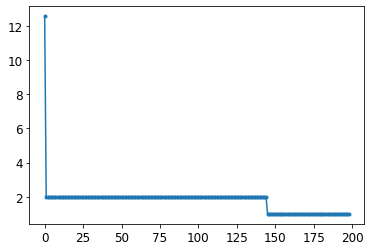

In [300]:
'''NEW IDEAS:
Use ParticipantExt() class to get features
Cluster/Bin participants based on home-time and see if survey scores correlate
'''

In [254]:
## Identify mode of latitude and longitude

nbins=200;

# Longitude
y,x = np.histogram(df2['longitude'], bins = nbins); # plt.plot(x[:-1],y,'.-');
long_mode = np.argmax(y); home_long = x[long_mode:long_mode+2]; 

# Latitude
y,x = np.histogram(df2['latitude'], bins = nbins); # plt.plot(x[:-1],y,'.-'); 
lat_mode = np.argmax(y); home_lat = x[lat_mode:lat_mode+2];

# Collect
home = np.array([home_long,
                 home_lat]); print(home)



[[-71.06557657 -71.06428269]
 [ 42.28254668  42.28351901]]


In [140]:
## Identify mode of latitude and longitude

nbins=200;

# Longitude
bin_lon = stats.binned_statistic(df2['longitude'],df2['longitude'],bins=nbins,statistic='mean');
n_eachbin = np.zeros(shape=(nbins,));
for ibin in range(nbins):
    n_eachbin[ibin] = np.sum(bin_lon[2] == ibin);
    
tmp_long_mode = np.argmax(n_eachbin); tmp_home_long = bin_lon[1][tmp_long_mode-1: tmp_long_mode+1];
# print(tmp_home_long); print(home_long)

# Latitude
bin_lat = stats.binned_statistic(df2['latitude'],df2['latitude'],bins=nbins,statistic='mean');
n_eachbin = np.zeros(shape=(nbins,));
for ibin in range(nbins):
    n_eachbin[ibin] = np.sum(bin_lat[2] == ibin);
    
tmp_lat_mode = np.argmax(n_eachbin); tmp_home_lat = bin_lat[1][tmp_lat_mode-1: tmp_lat_mode+1];

home_mode = np.array([tmp_home_long,
                     tmp_home_lat]); print(home_mode)

# # Add to dataframe - Uncomment after first run
# df2.insert(6,'Longit. bin',bin_lon[2],True)
# df2.insert(6,'Latit. bin',bin_lat[2],True)

print(df2.head())

[[-71.06557657 -71.06428269]
 [ 42.28254668  42.28351901]]
    Unnamed: 0      timestamp               Date-Time Day of week   latitude  \
0            0  1611785367867 2021-01-27 22:09:27.867   Wednesday  42.283373   
4            4  1611785332900 2021-01-27 22:08:52.900   Wednesday  42.283373   
8            8  1611785309899 2021-01-27 22:08:29.899   Wednesday  42.283373   
12          12  1611785286875 2021-01-27 22:08:06.875   Wednesday  42.283372   
16          16  1611785246882 2021-01-27 22:07:26.882   Wednesday  42.283372   

    longitude  Latit. bin  Longit. bin  
0  -71.064843          84          147  
4  -71.064843          84          147  
8  -71.064844          84          147  
12 -71.064837          84          147  
16 -71.064837          84          147  


In [139]:
del df2['Longit. bin'];
del df2['Latit. bin']

/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


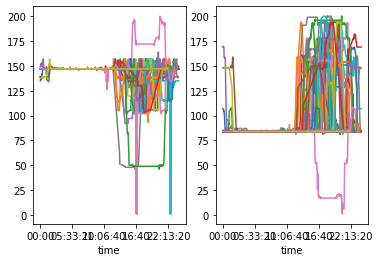

In [141]:
## For each day, determine the time spent at home

days = df2['Date-Time'].dt.date; 
days = np.unique(days); 

tm_home = np.zeros(shape=(len(days),));
for iday,gday in enumerate(days):
    lon = df2['Longit. bin'][df2['Date-Time'].dt.date == gday];
    lat = df2['Latit. bin'][df2['Date-Time'].dt.date == gday];
    tm = df2['Date-Time'][df2['Date-Time'].dt.date == gday].dt.time;
    
    

In [37]:
# Read in the passive data for all patients

## Extra variable assignments to send to Ryan D
NIH2_RESEARCHER = "rzhd6cwztfqw0tagx0s5"  
NIH2_STUDIES = LAMP.Study.all_by_researcher(NIH2_RESEARCHER)['data']
good_idx = array([ 5,  6, 10, 13, 15, 16, 20, 21, 22, 26, 27, 28, 29, 30, 31, 32, 34,
       35, 36, 37, 40, 41, 42, 43, 45, 46, 50, 51, 52, 53, 56, 57, 58, 59,
       60, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]); # to send to Ryan D
nsubj = len(good_idx);

participant_accel = np.empty(shape=(nsubj,),dtype='object')
for i_subj in tqdm(range(nsubj),position=0,leave=True):
    istudy = good_idx[i_subj];
    PARTICIPANT = LAMP.Participant.all_by_study(NIH2_STUDIES[istudy]['id'])['data'][0]['id'];
    xx2=np.array([]);
    
    print(f'----------------------- {i_subj} ----------------------')
    kk = LAMP.SensorEvent.all_by_participant(PARTICIPANT, origin="lamp.accelerometer")
    while(len(kk['data'])>1):
        
        # Update time
        nexttime = kk['data'][-1]['timestamp']; st = kk['data'][0]['timestamp']; nn=len(kk['data']);
        #print(f'[0 time]: {st}, [end time]: {nexttime}, npts: {nn}')
        
        # Append to collection
        xx = np.array(kk['data']);
        xx2 = np.hstack((xx2,xx));
        
        # Retrieve data counting backwards from start of survey
        kk = LAMP.SensorEvent.all_by_participant(PARTICIPANT, origin="lamp.accelerometer", to=nexttime);
        
    participant_accel[i_subj] = xx2;
    
    

  1%|▏         | 1/72 [24:15<28:42:47, 1455.88s/it]----------------------- 1 ----------------------
> <ipython-input-37-54d7ef49d8b4>(4)<module>()
      2 
      3 participant_accel = np.empty(shape=(nsubj,),dtype='object')
----> 4 for i_subj in tqdm(range(nsubj),position=0,leave=True):
      5     PARTICIPANT = LAMP.Participant.all_by_study(NIH2_STUDIES[isubj]['id'])['data'][0]['id'];
      6     xx2=np.array([]);

  1%|▏         | 1/72 [49:16<58:18:42, 2956.65s/it]


BdbQuit: 

In [142]:
import LAMP
import math
import pandas as pd
import datetime
LAMP.connect("admin", "LAMPLAMP")
study_id = LAMP.Study.all_by_researcher('rzhd6cwztfqw0tagx0s5')['data'][2]['id']
acts = LAMP.Activity.all_by_study(study_id)['data']
act_dict = {}
for act in acts:
    if act['id'] not in act_dict:
        act_dict[act['id']] = act['name']
participants = [p['id'] for p in LAMP.Participant.all_by_study(study_id)['data']]
final_df = pd.DataFrame()
for part in participants:
    try:
        print(part)
        act_events = LAMP.ActivityEvent.all_by_participant(part)
        df = pd.DataFrame(act_events['data'])
        df['activity_name'] = df['activity'].map(act_dict)
        l = [part for i in range(len(act_events['data']))]
        df['participant_id'] = l
        final_df = pd.concat(([final_df, df]),ignore_index=True)
    except KeyError:
        print(part + '__Key Error')
final_df['timestamp'] = pd.to_datetime(final_df['timestamp'], unit='ms')
temp_df = pd.concat([pd.DataFrame(i) for i in final_df['temporal_slices']], keys = final_df.index).reset_index(level=1,drop=True)
final_df = final_df.drop('temporal_slices', axis=1).join(temp_df, lsuffix='index').reset_index(drop=True)
final_df = pd.concat([final_df.drop(['static_data'], axis=1), final_df['static_data'].apply(pd.Series)], axis=1)
final_df

U4054795418


/Users/tanviranjan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



,activity,durationindex,timestamp,activity_name,participant_id,duration,item,level,type,value,...,score,correct_answers,wrong_answers,type,total_attempts,total_bonus_collected,total_jewels_collected,rating,game_name,drawn_figure
0,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,6375.0,9,1.0,True,1,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,280.0,6,1.0,True,1,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,9534.0,8,2.0,True,2,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,251.0,12,2.0,True,2,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
4,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,218.0,11,2.0,True,2,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
5,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,11466.0,1,3.0,True,3,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
6,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,683.0,4,3.0,True,3,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
7,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,500.0,11,3.0,True,3,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
8,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,534.0,13,3.0,True,3,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
9,xvfyd5rasgjr1cxs62vz,62000,2019-10-15 20:00:32,Spatial Span,U4054795418,13619.0,3,4.0,True,4,...,100,14.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:


# '_from' and 'to' are UNIX timestamps to specify a time window
# 
participant_accel_tr = LAMP.SensorEvent.all_by_participant(TEST_PARTICIPANT, origin="beiwe.accelerometer", _from='1575487400000', to='1575487450000')
participant_accel_tr['data'][:5]


[{'timestamp': 1575487447640,
  'sensor': 'beiwe.accelerometer',
  'data': {'accuracy': 'unknown',
   'x': 0.0373687744140625,
   'y': 0.020538330078125,
   'z': -0.993865966796875}},
 {'timestamp': 1575487447539,
  'sensor': 'beiwe.accelerometer',
  'data': {'accuracy': 'unknown',
   'x': 0.0358123779296875,
   'y': 0.0201568603515625,
   'z': -0.9930572509765625}},
 {'timestamp': 1575487447439,
  'sensor': 'beiwe.accelerometer',
  'data': {'accuracy': 'unknown',
   'x': 0.0367584228515625,
   'y': 0.0227203369140625,
   'z': -0.9905853271484375}},
 {'timestamp': 1575487447338,
  'sensor': 'beiwe.accelerometer',
  'data': {'accuracy': 'unknown',
   'x': 0.0370941162109375,
   'y': 0.019775390625,
   'z': -0.9944915771484375}},
 {'timestamp': 1575487447237,
  'sensor': 'beiwe.accelerometer',
  'data': {'accuracy': 'unknown',
   'x': 0.0363616943359375,
   'y': 0.020050048828125,
   'z': -0.9917449951171875}}]

In [8]:
# ## Query surveys

# ##### Surveys are ActivityEvents, with each survey type defined as an Activity 
# 
# ##### 'duration' is the survey completion time, in ms
# 
# ##### 'activity' is the Activity id
# 
# ##### 'temporal_slices' contains responses for each survey question


In [1]:


LAMP.ActivityEvent.all_by_participant(TEST_PARTICIPANT)['data'];



NameError: name 'LAMP' is not defined

In [9]:
pip 



